In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def count_collisions(array1, array2, threshold=3):
    """
    Count number of trajectories that experience at least one collision 
    between corresponding trajectories in array1 and array2.

    Parameters:
        array1: np.ndarray of shape (n_traj, horizon, num_states)
        array2: np.ndarray of shape (n_traj, horizon, num_states)
        threshold: float, distance below which a collision is counted

    Returns:
        num_colliding_trajectories: int
    """
    assert array1.shape == array2.shape, "Arrays must have the same shape"

    # Compute pairwise distances along the trajectory (n_traj, horizon)
    distances = np.linalg.norm(array1 - array2, axis=2)

    # print(distances)

    # Check where distance is below threshold
    collision_mask = distances < threshold  # shape: (n_traj, horizon)

    # Count how many trajectories have at least one collision
    num_colliding_trajectories = np.sum(np.any(collision_mask, axis=1))

    return num_colliding_trajectories

In [4]:
def count_collisions_obstacle(array1, array2, radius=4):
    """
    Count number of trajectories that experience at least one collision 
    between corresponding trajectories in array1 and array2.

    Parameters:
        array1: np.ndarray of shape (n_traj, horizon, num_states)
        array2: np.ndarray of shape (n_traj, horizon, num_states)
        radius: float, distance below which a collision with the obstacle is counted

    Returns:
        num_colliding_trajectories: int
    """
    assert array1.shape == array2.shape, "Arrays must have the same shape"

    collision_count = 0
    for i in range(array1.shape[0]):
        for j in range(array1.shape[1]):
            if np.linalg.norm(array1[i][j] - np.array([10, 0])) < radius or \
               np.linalg.norm(array2[i][j] - np.array([10, 0])) < radius:
                collision_count += 1
                break
    
    return collision_count

In [5]:
def count_total_collisions(array1, array2,
                           threshold: float = 3.0,
                           radius: float = 4.0,
                           obstacle_center: np.ndarray = np.array([10.0, 0.0])
                          ) -> int:
    """
    Count number of trajectory-pairs that experience at least one
    collision *either* between array1 and array2 *or* with the obstacle.

    Parameters:
        array1: np.ndarray, shape (n_traj, horizon, num_states)
        array2: np.ndarray, shape (n_traj, horizon, num_states)
        threshold: float, distance below which two agents collide
        radius: float, distance below which an agent collides with obstacle
        obstacle_center: np.ndarray, shape (2,), [x,y] of the obstacle

    Returns:
        total_collisions: int
            number of trajectories where (self-collision ∪ obstacle-collision)
    """
    assert array1.shape == array2.shape, "Arrays must have the same shape"
    n_traj, horizon, num_states = array1.shape

    # 1) self-collision mask: shape (n_traj,)
    dists = np.linalg.norm(array1 - array2, axis=2)        # (n_traj, horizon)
    self_collision = np.any(dists < threshold, axis=1)     # (n_traj,)

    # 2) obstacle-collision mask: shape (n_traj,)
    #    (check only the XY dimensions for obstacle contact)
    pos1 = array1[..., :2]                                 # (n_traj, horizon, 2)
    pos2 = array2[..., :2]                                 # (n_traj, horizon, 2)
    d1 = np.linalg.norm(pos1 - obstacle_center, axis=2)    # (n_traj, horizon)
    d2 = np.linalg.norm(pos2 - obstacle_center, axis=2)    # (n_traj, horizon)
    obs_collision = np.any((d1 < radius) | (d2 < radius), axis=1)

    # 3) union and count
    total_mask = self_collision | obs_collision
    return int(np.sum(total_mask))

In [4]:
# Diffusion MPC

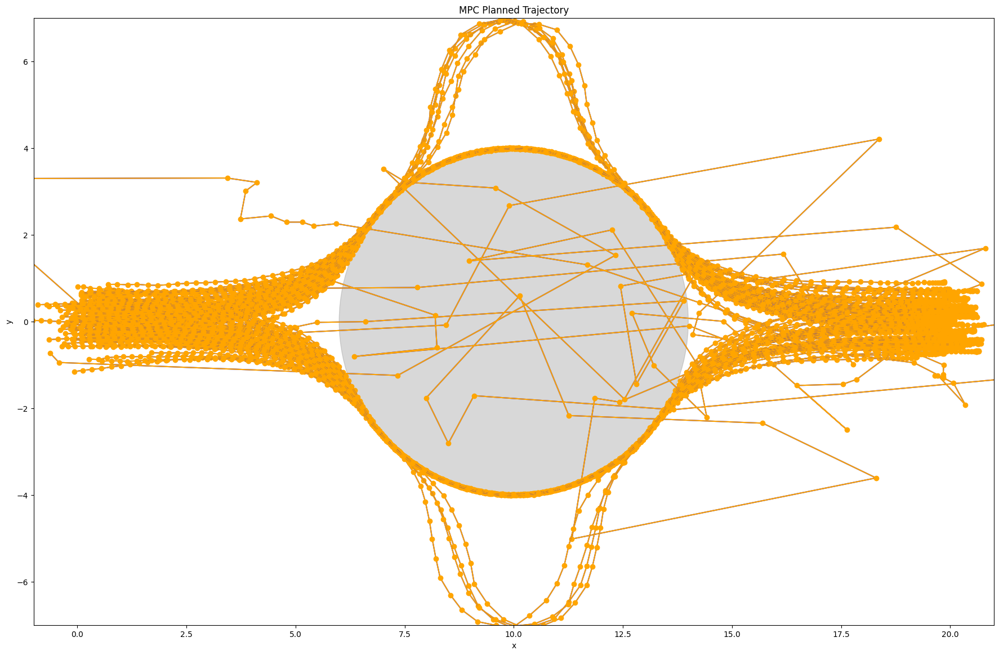

In [3]:
plt.figure(figsize=(22, 14))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P10E1/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()
    

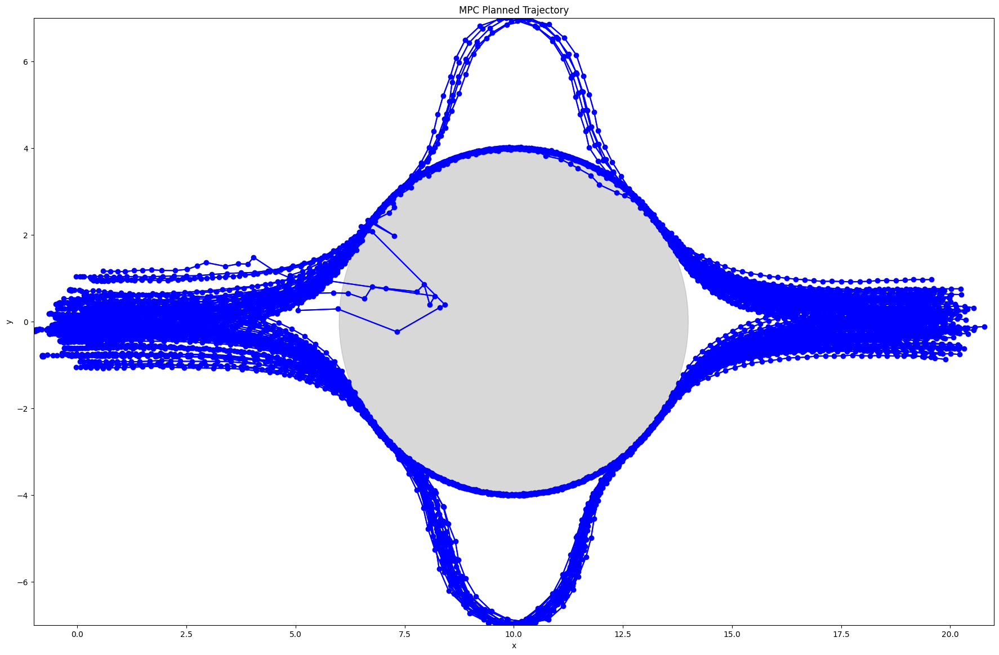

In [4]:
plt.figure(figsize=(22, 14))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P10E1/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [5]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99)

np.int64(61)

In [8]:
# T100

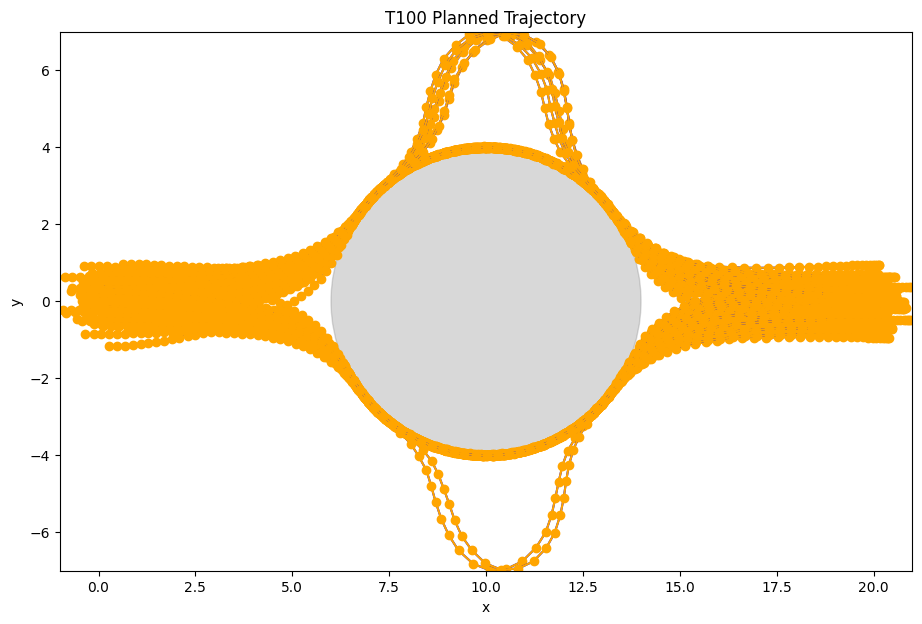

In [53]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("T100 Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/T100/traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

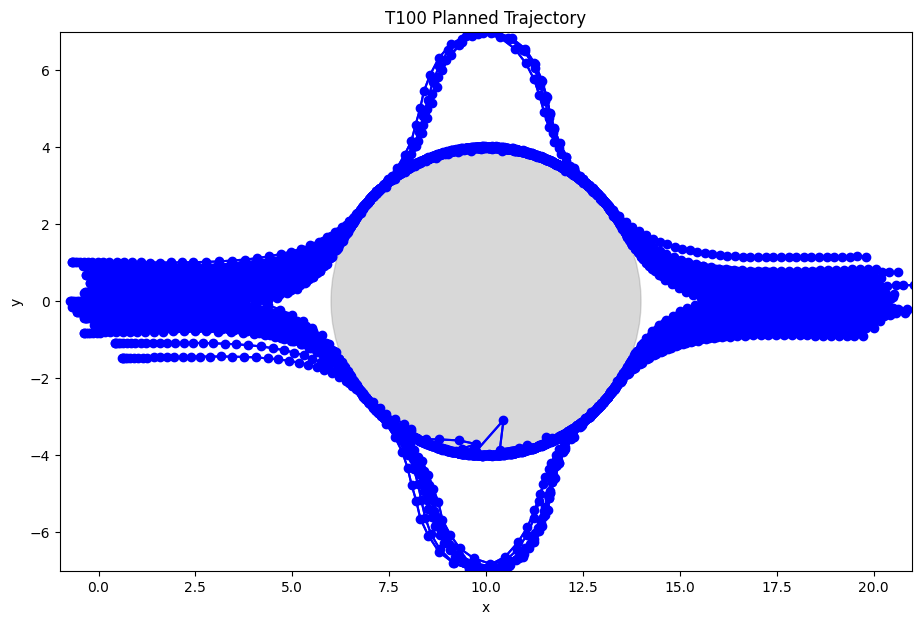

In [54]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("T100 Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/T100/traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

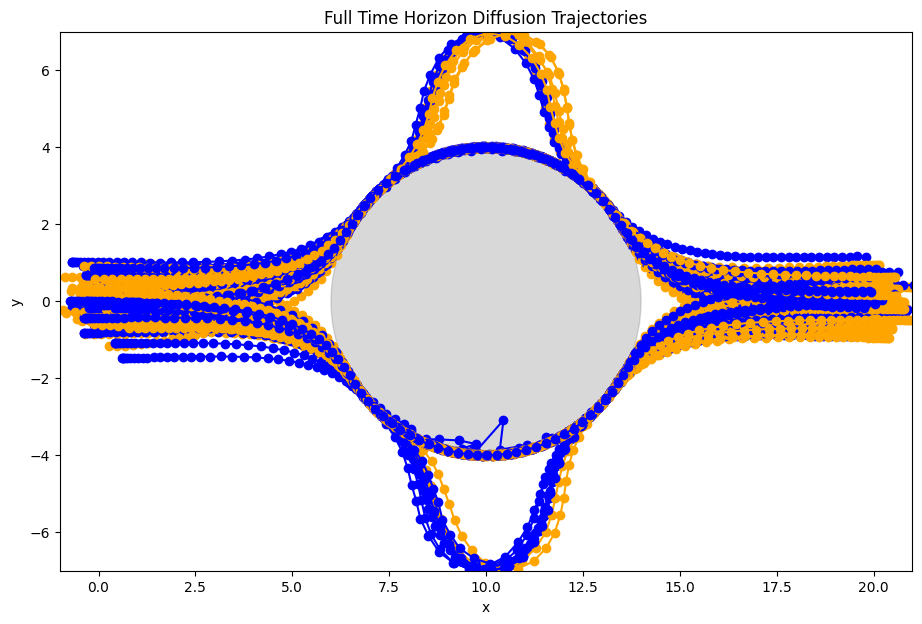

In [60]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Full Time Horizon Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [56]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(45)

In [62]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

1

In [69]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

53

In [13]:
# Diffusion MPC with Leader Follower Guidance

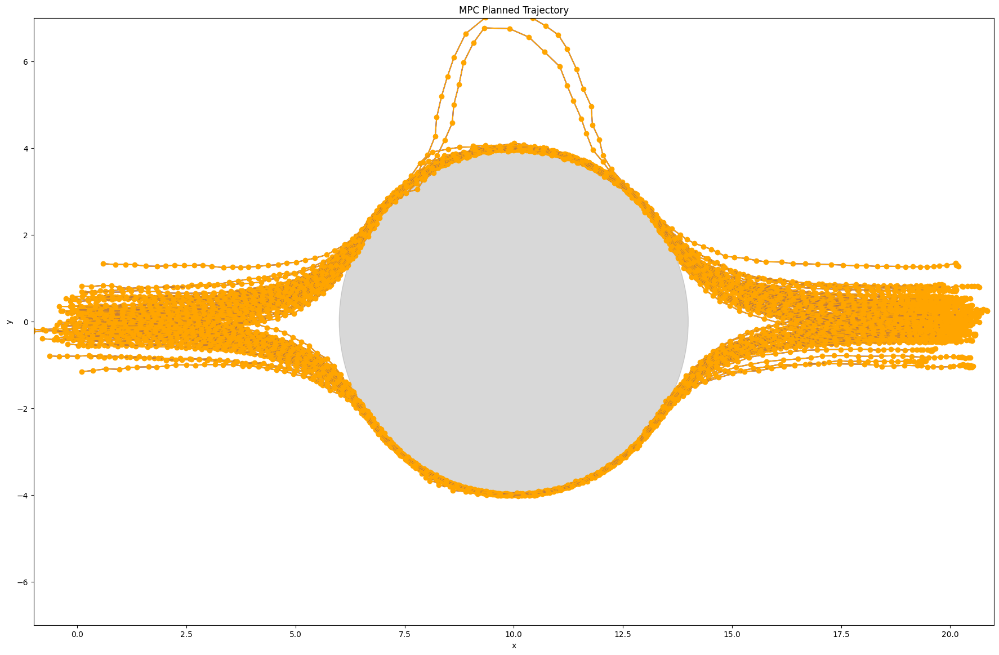

In [13]:
plt.figure(figsize=(22, 14))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_guidance_P10E1/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

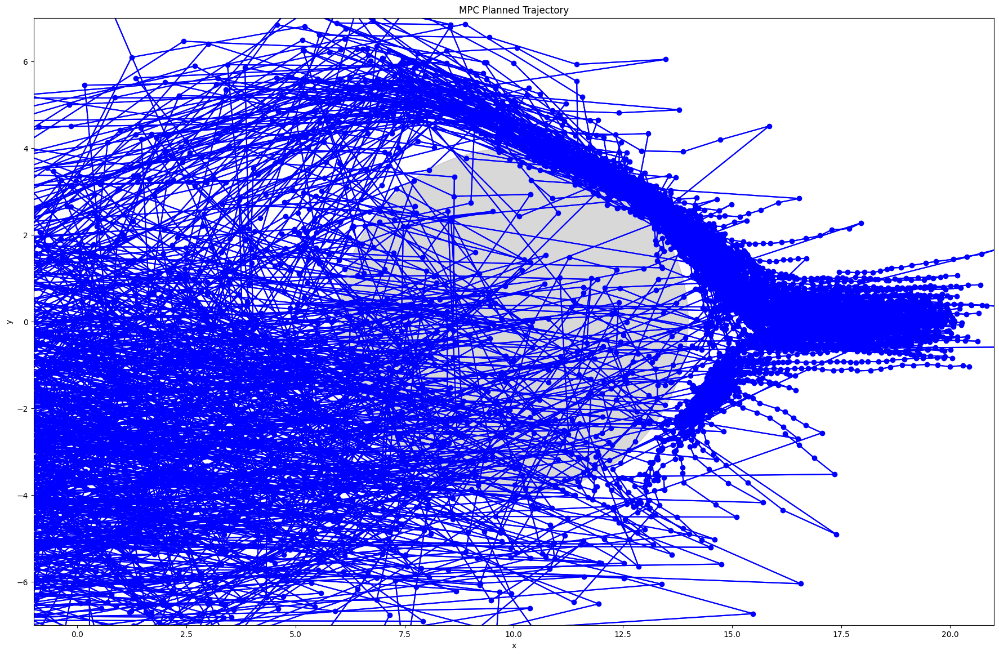

In [14]:
plt.figure(figsize=(22, 14))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_guidance_P10E1/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [13]:
#  Diffusion MPC conditioned on 5th point ahead of the leader

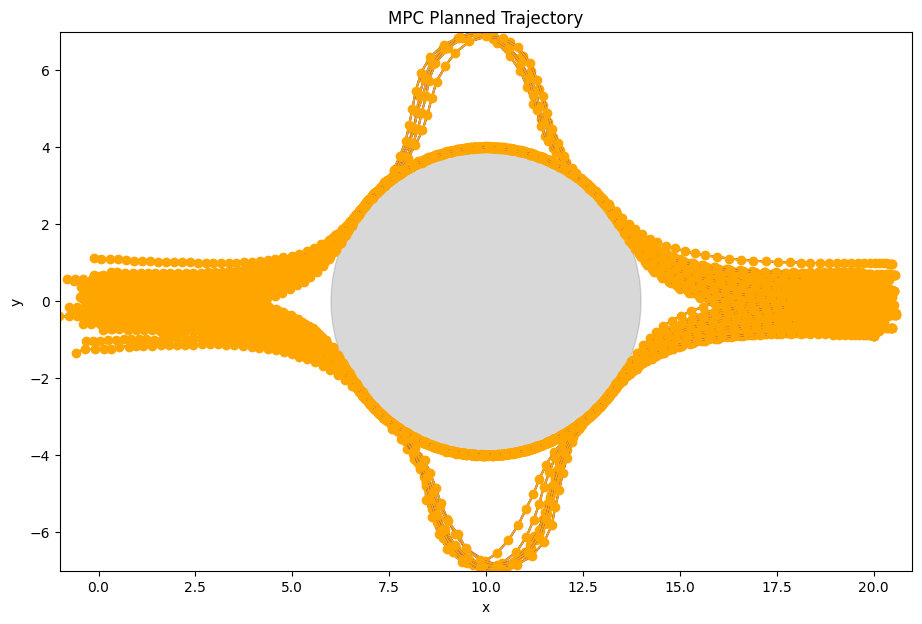

In [28]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

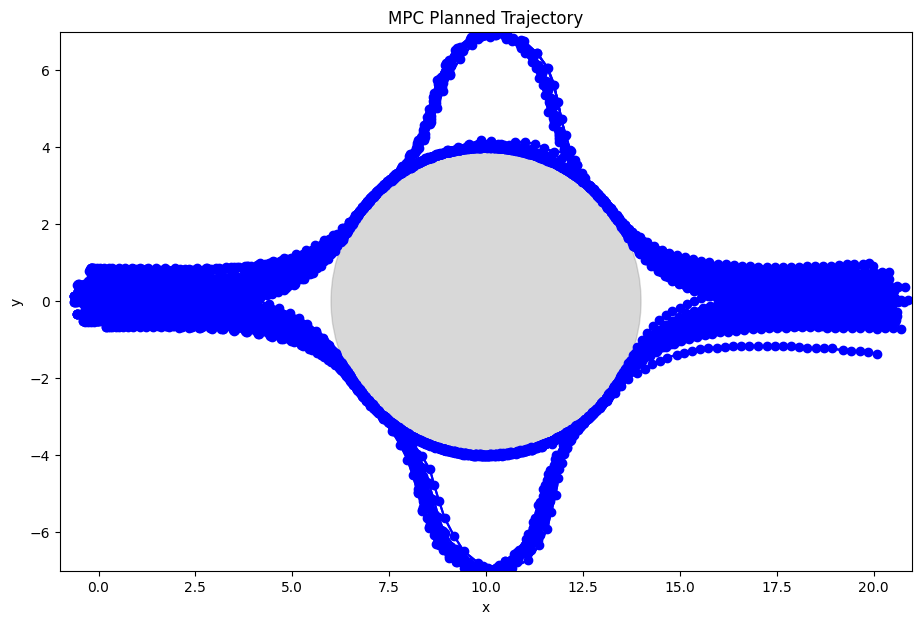

In [29]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [30]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(14)

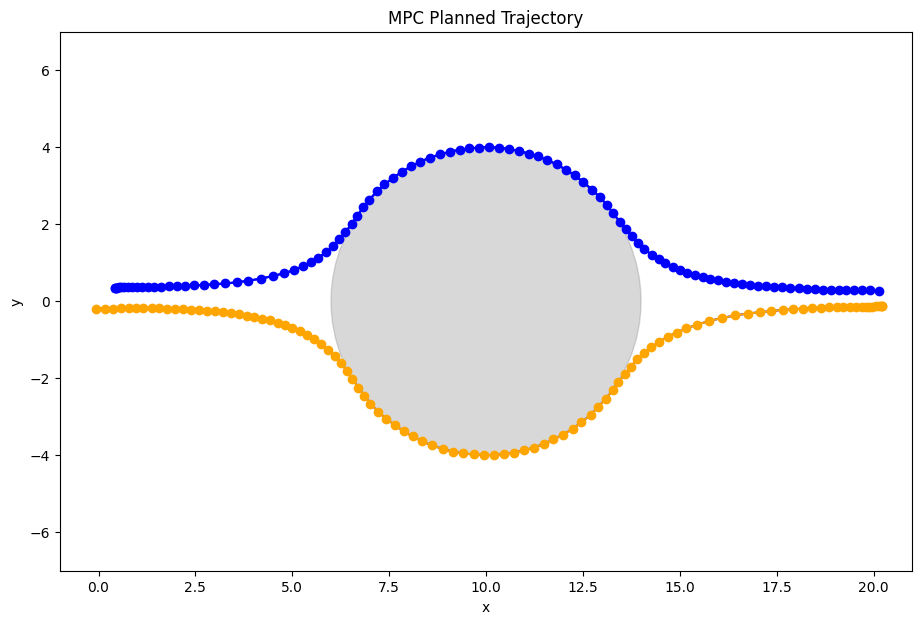

In [292]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

i = 0
data = np.load("sampled_trajs/mpc_P25E5/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E5/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [ ]:
#  Diffusion MPC conditioned on 3th point ahead of the leader

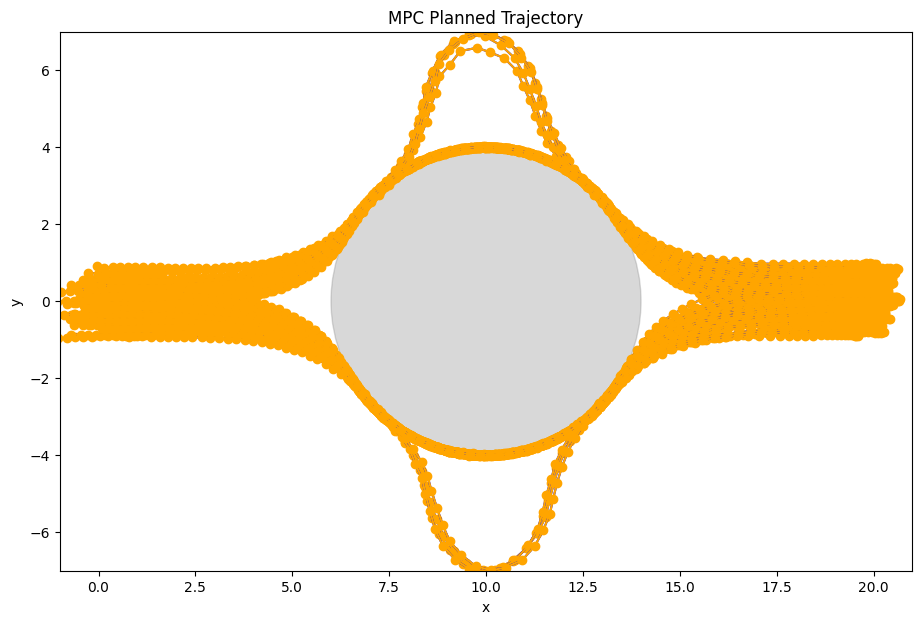

In [31]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

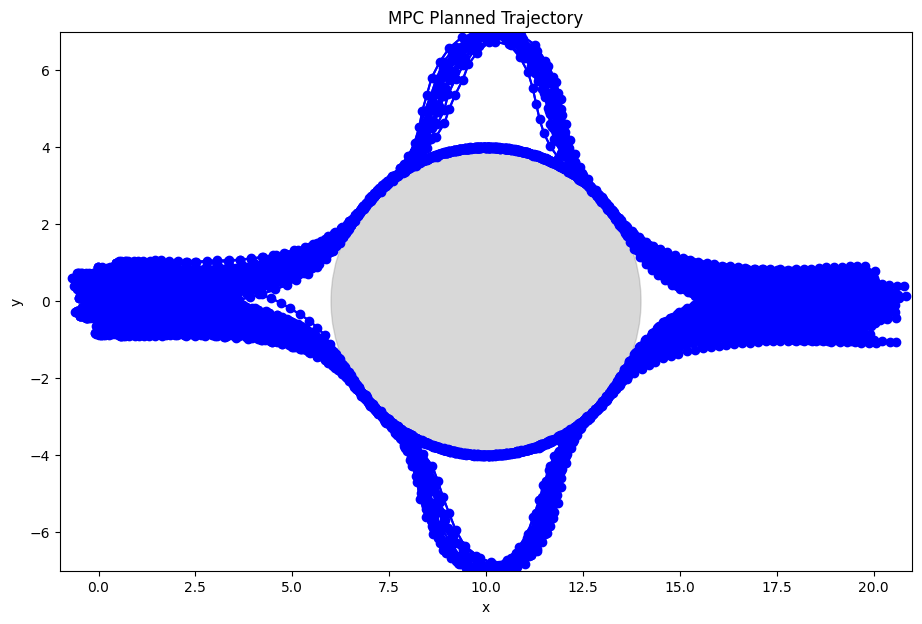

In [32]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [36]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(4)

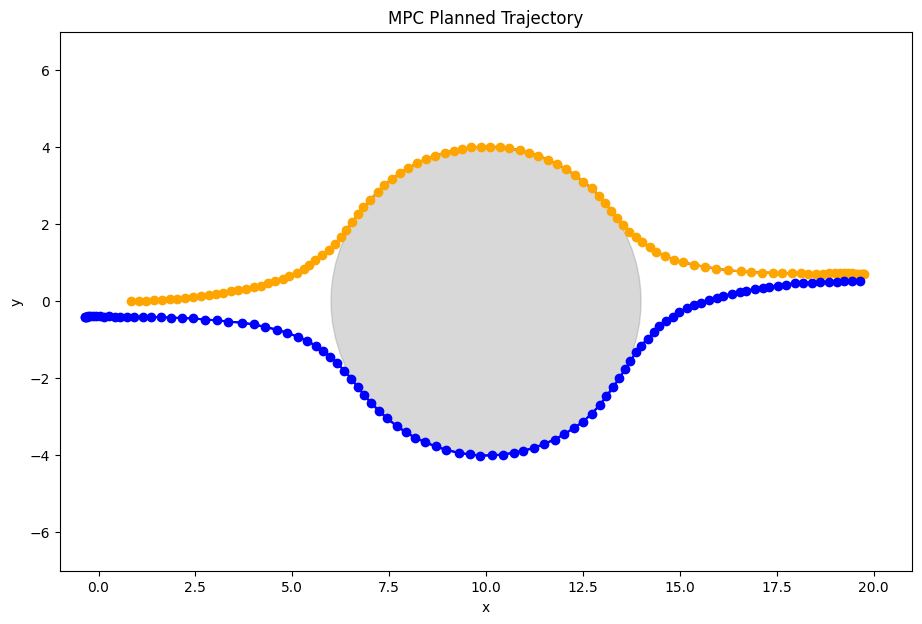

In [ ]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

i = 60
data = np.load("sampled_trajs/mpc_P25E3/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E3/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [1]:
#  Diffusion MPC P10E5

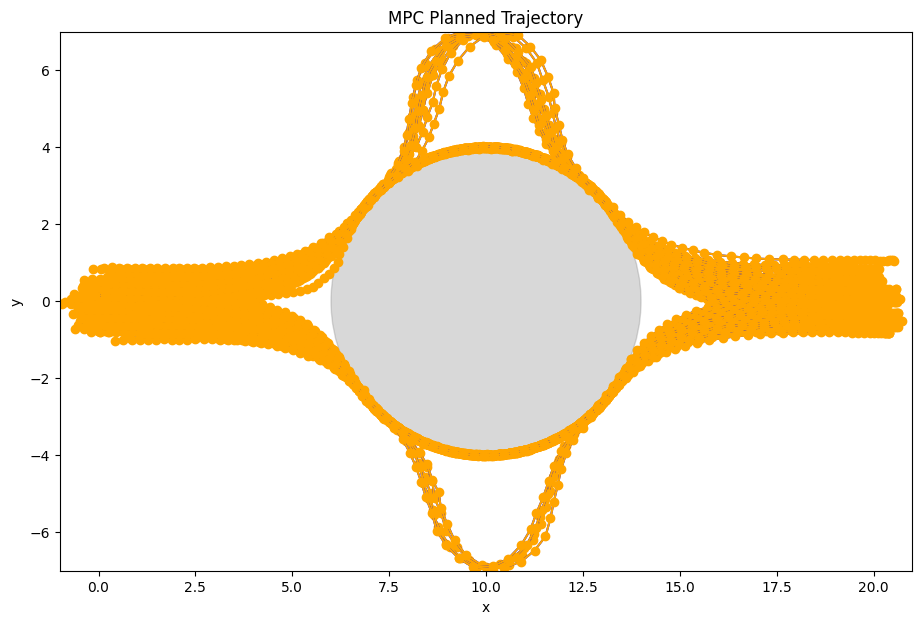

In [37]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P10E5/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

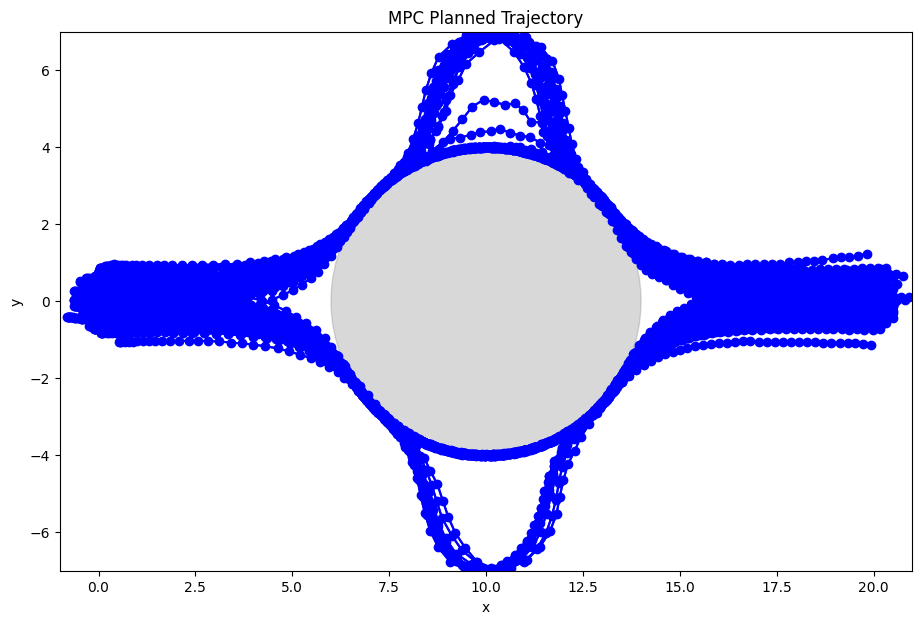

In [38]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P10E5/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [43]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(13)

In [ ]:
#  Diffusion MPC P20E10 conditioned on 10th point ahead of the leader

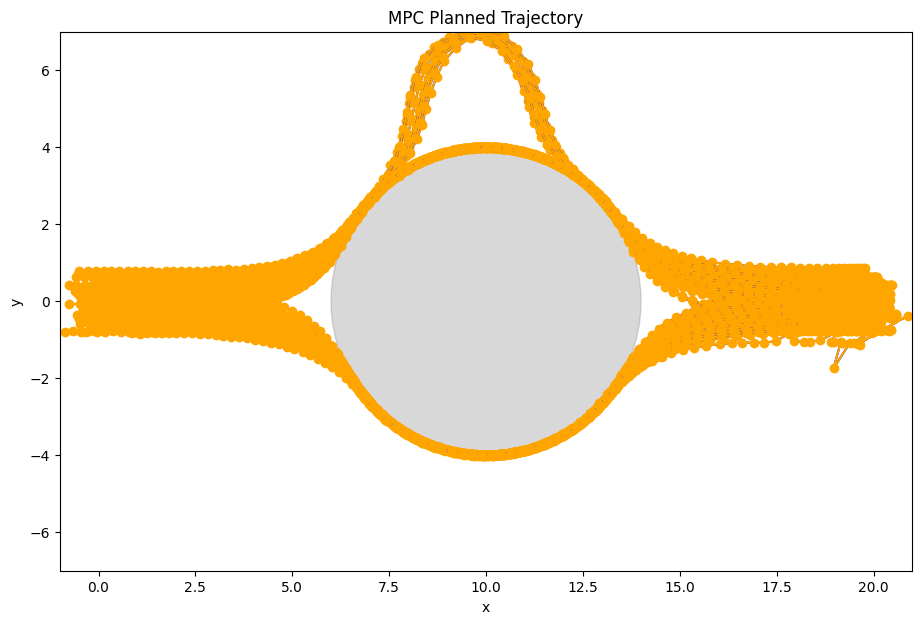

In [44]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P20E10/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

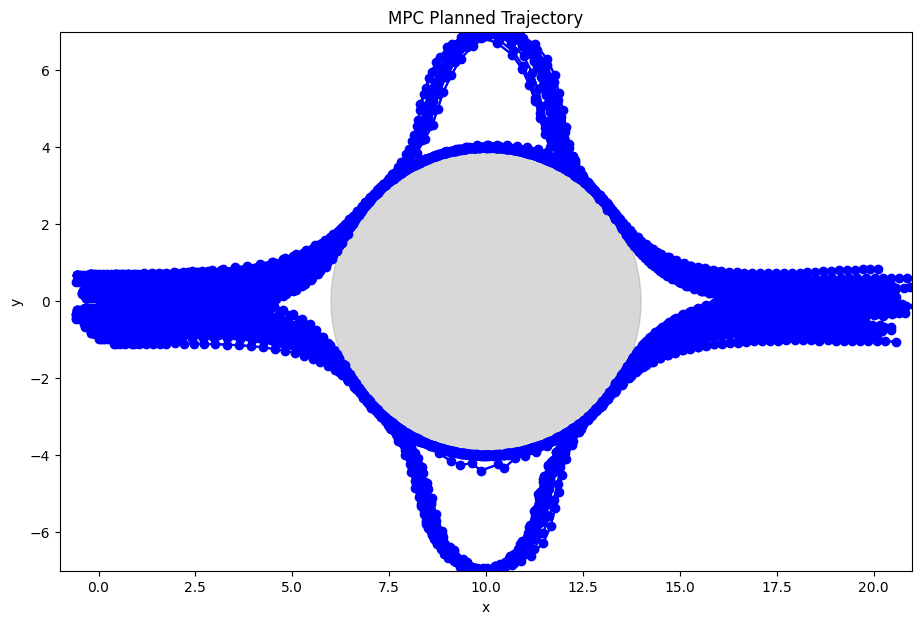

In [45]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P20E10/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [51]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(6)

In [ ]:
#  Diffusion MPC P20E10 conditioned on 10th point ahead of the leader with latent history of horizon 10

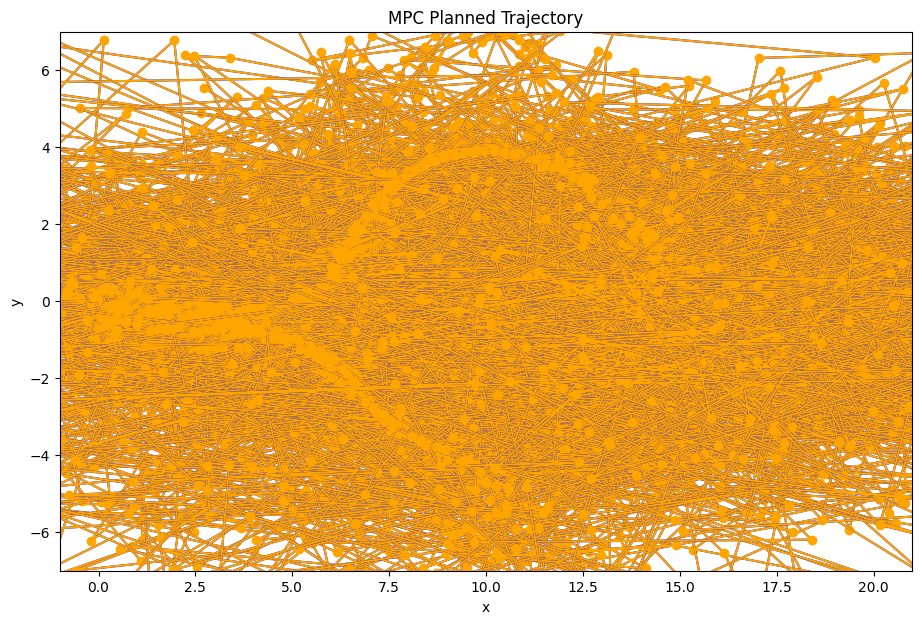

In [4]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latent_P10E1/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

In [ ]:
#  Diffusion MPC P10E3 conditioned on 3rd point ahead of the leader with latent history

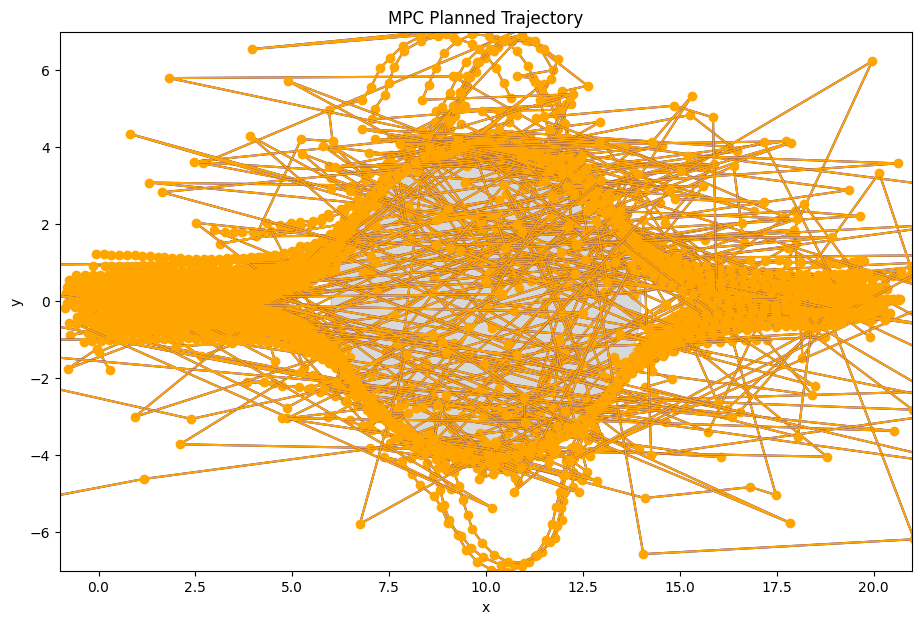

In [4]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latent_P10E3/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

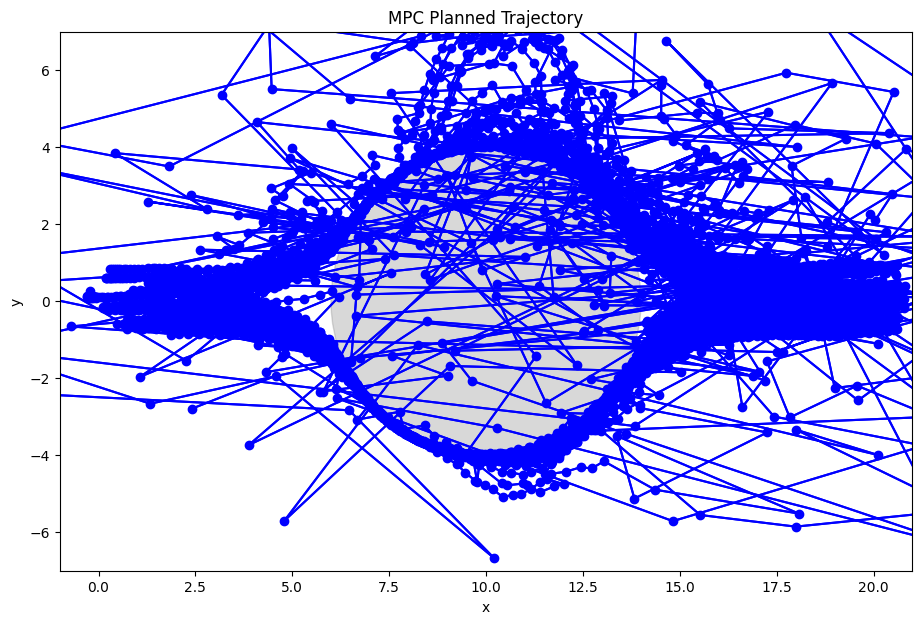

In [6]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latent_P10E3/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [7]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99)

48

In [3]:
#  Diffusion MPC P10E3 conditioned on 3rd point ahead of the leader with latent history which is now simultaneously trained with the diffusion model

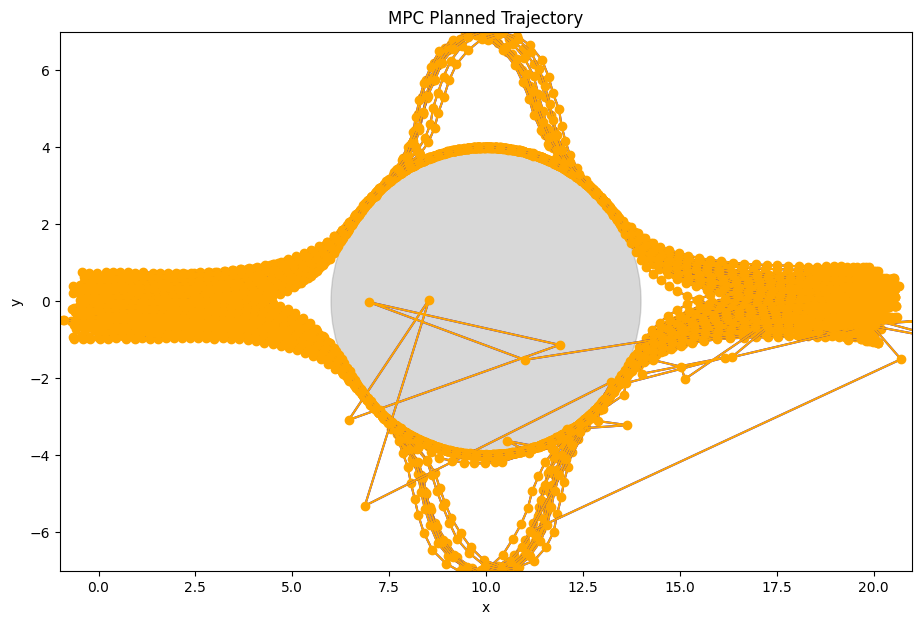

In [52]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P10E3/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

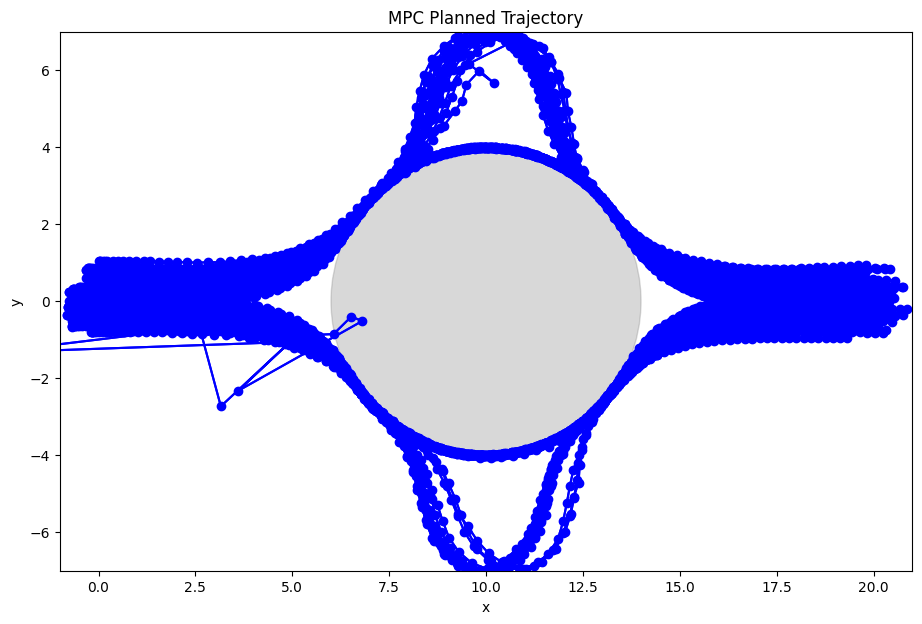

In [53]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P10E3/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [58]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(25)

In [1]:
#  Diffusion MPC P25E3 with new MPC data

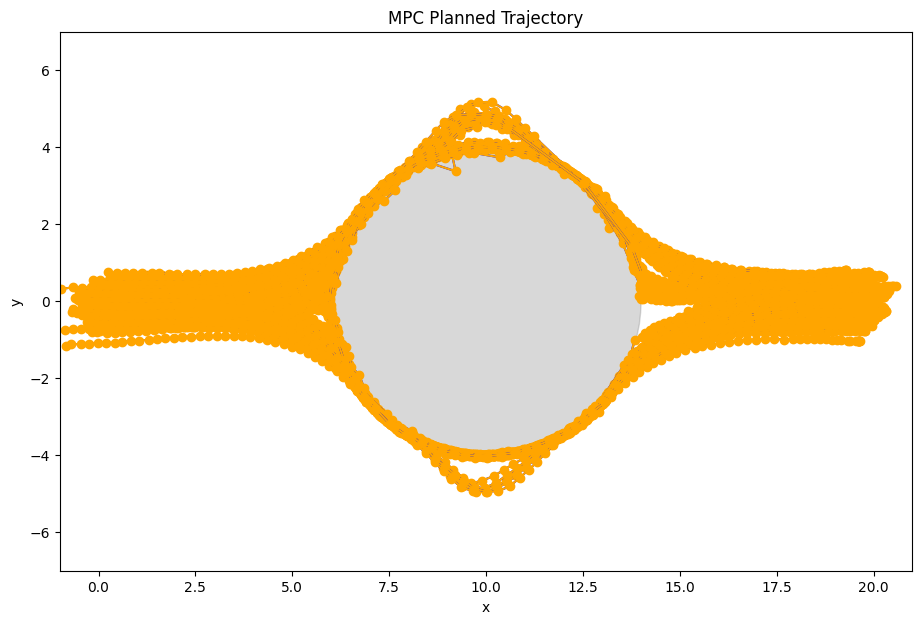

In [65]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_mpcdata2/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

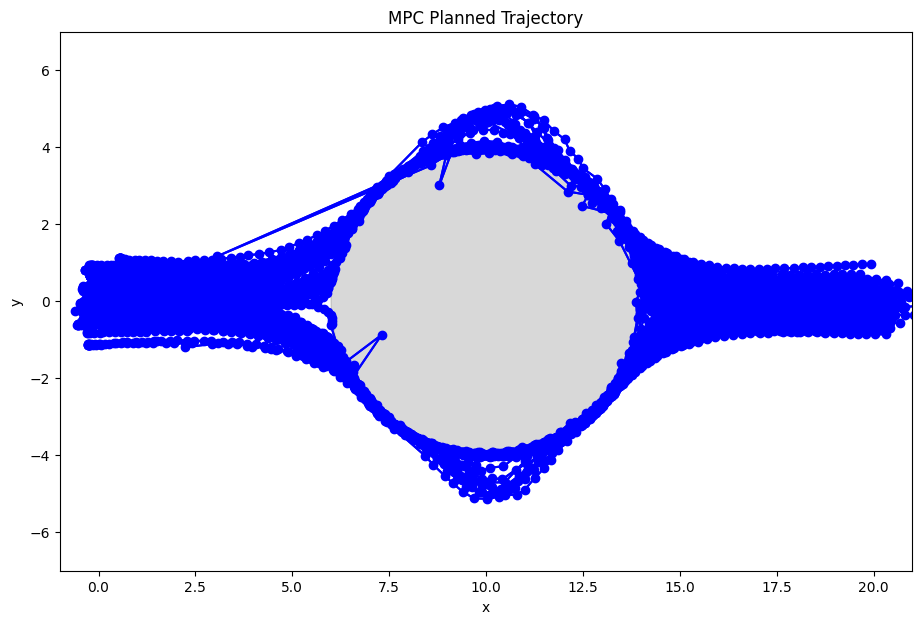

In [66]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_mpcdata2/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [71]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.25)

np.int64(30)

In [ ]:
#  Diffusion MPC P25E3 with new MPC data and sampling guidance

FileNotFoundError: [Errno 2] No such file or directory: 'sampled_trajs/mpc_P25E3_mpcdata/mpc_traj1_0.npy'

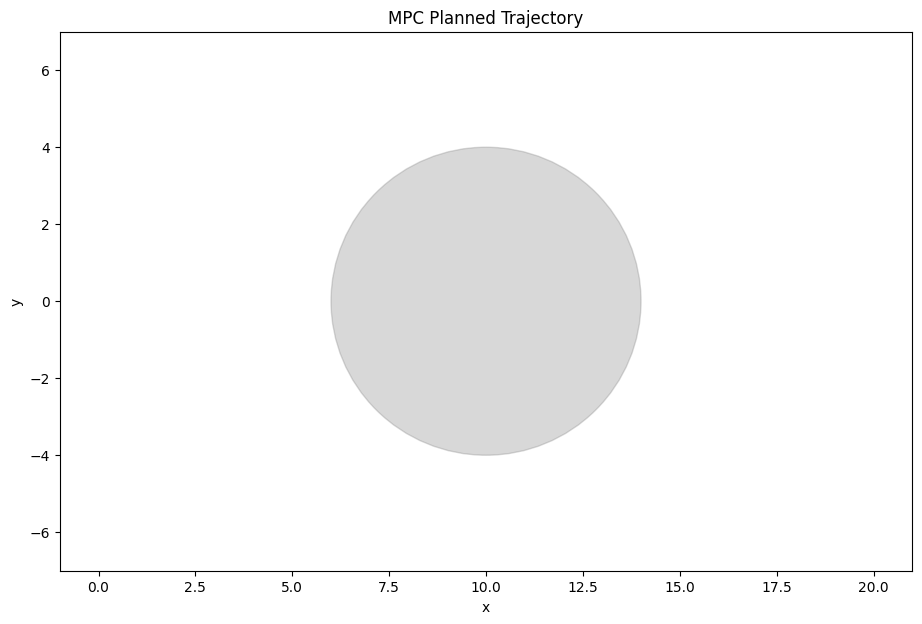

In [72]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_mpcdata/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

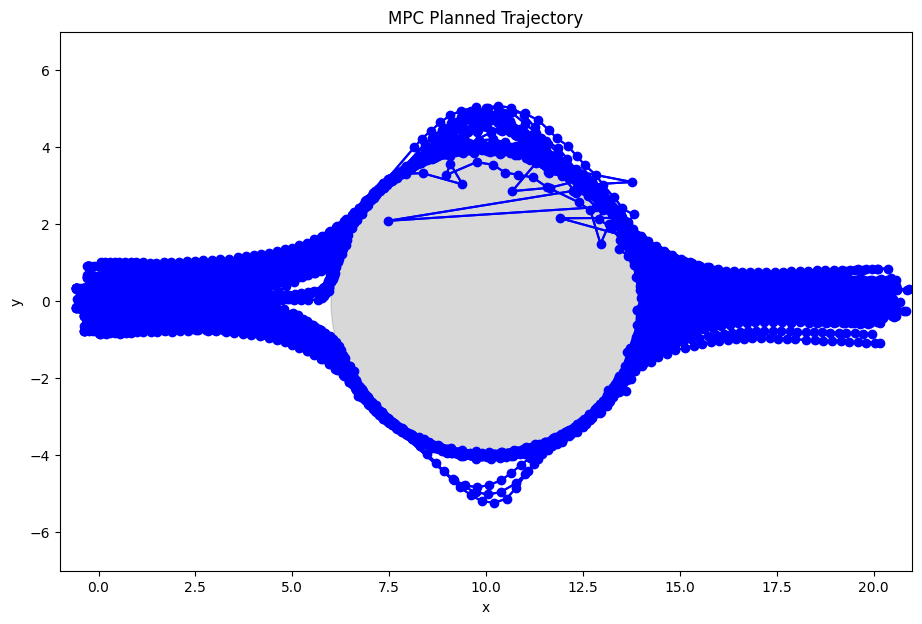

In [136]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_mpcdata/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [137]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=.2)

np.int64(21)

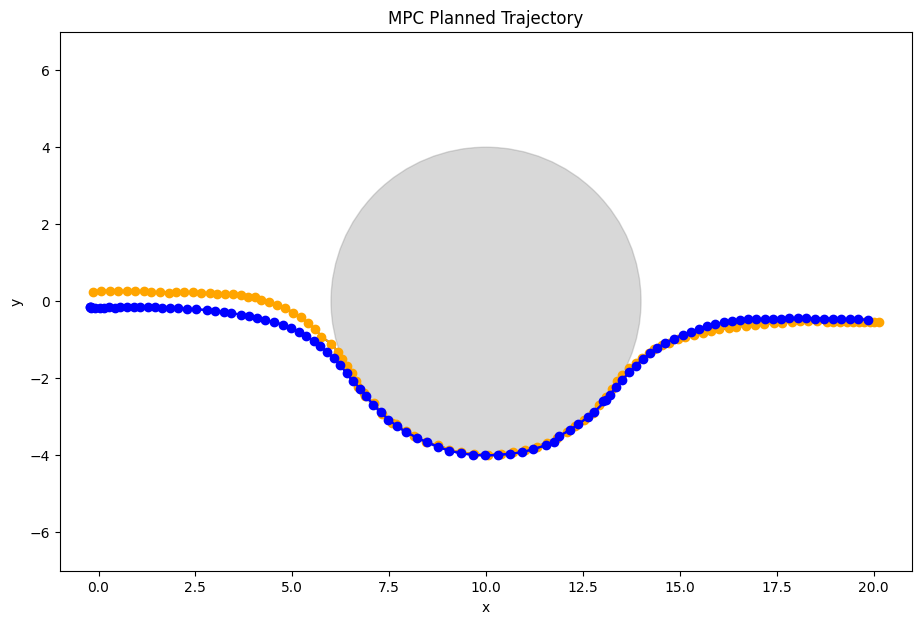

In [139]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

i = 0
data = np.load("sampled_trajs/mpc_P25E3_mpcdata/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E3_mpcdata/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [ ]:
#  Diffusion MPC P25E3 with old data and sampling guidance

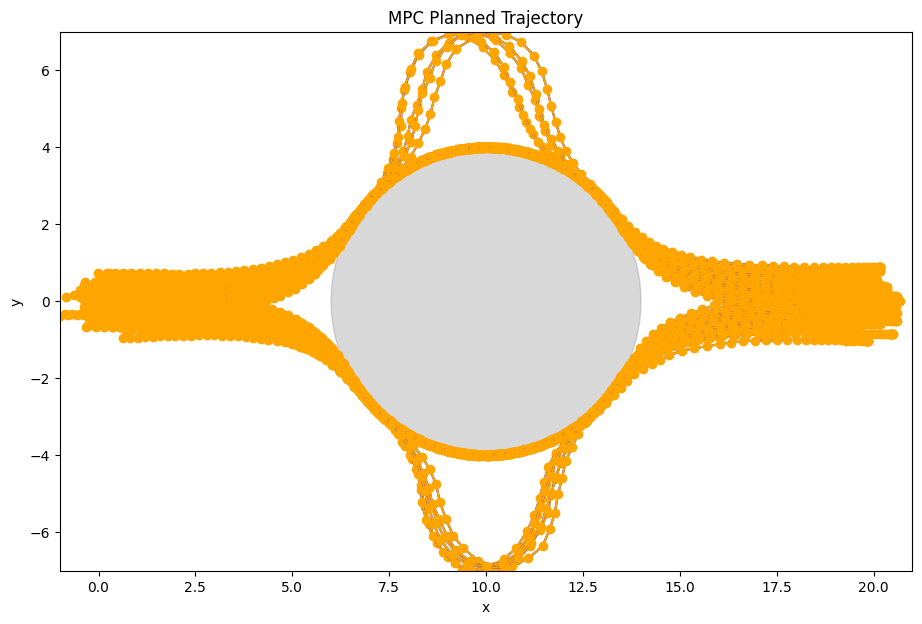

In [73]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_guidesample1/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

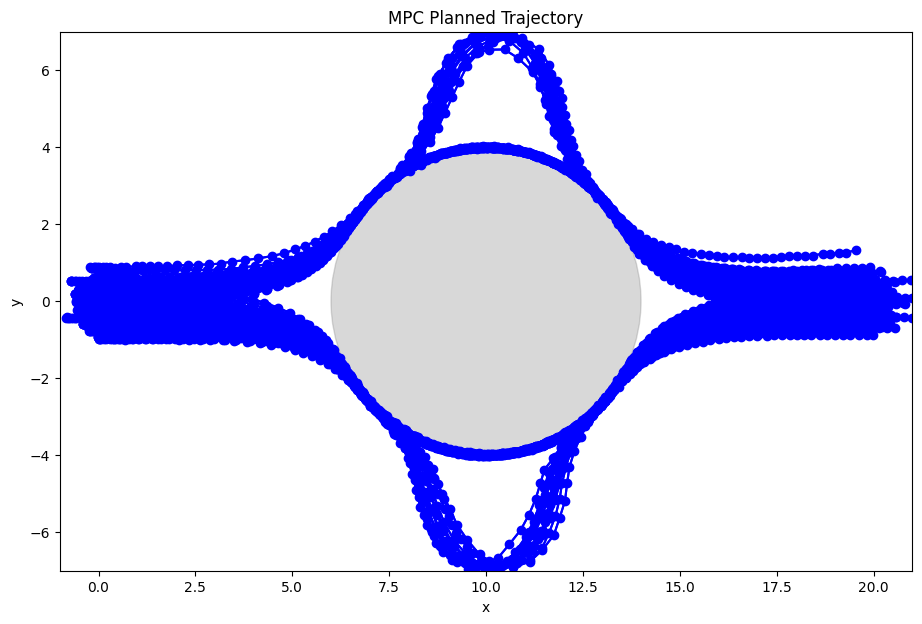

In [74]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_guidesample1/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [79]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(13)

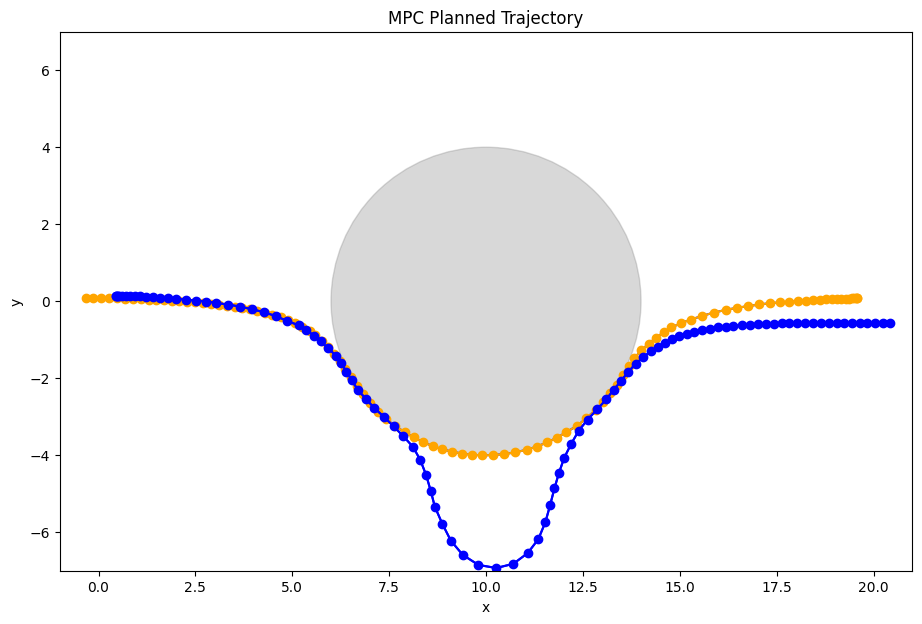

In [145]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

i = 23
data = np.load("sampled_trajs/mpc_P25E3_guidesample1/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E3_guidesample1/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [146]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=3.99)

np.int64(1)

In [ ]:
#  Diffusion MPC P25E5 with old data and sampling guidance

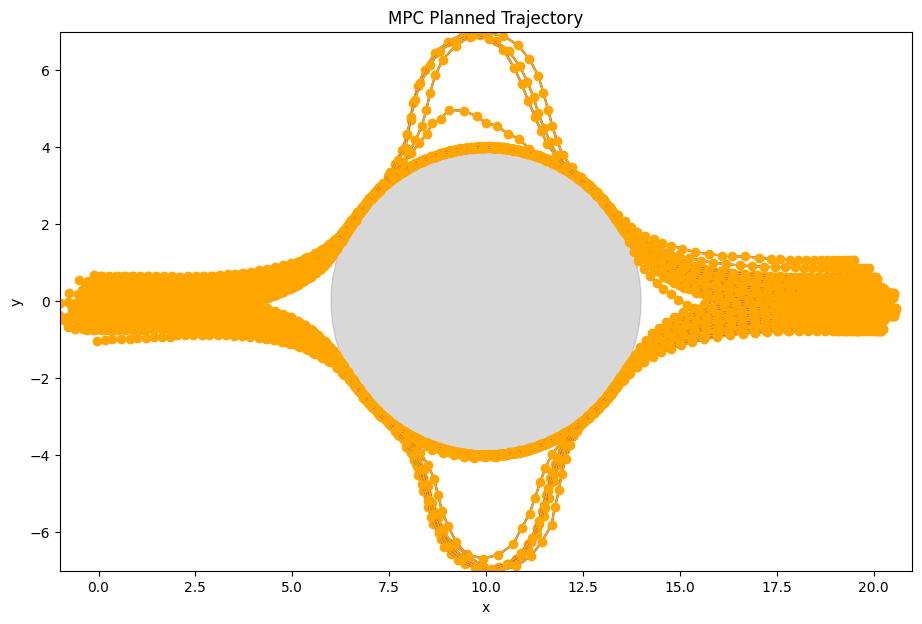

In [80]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_guidesample/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

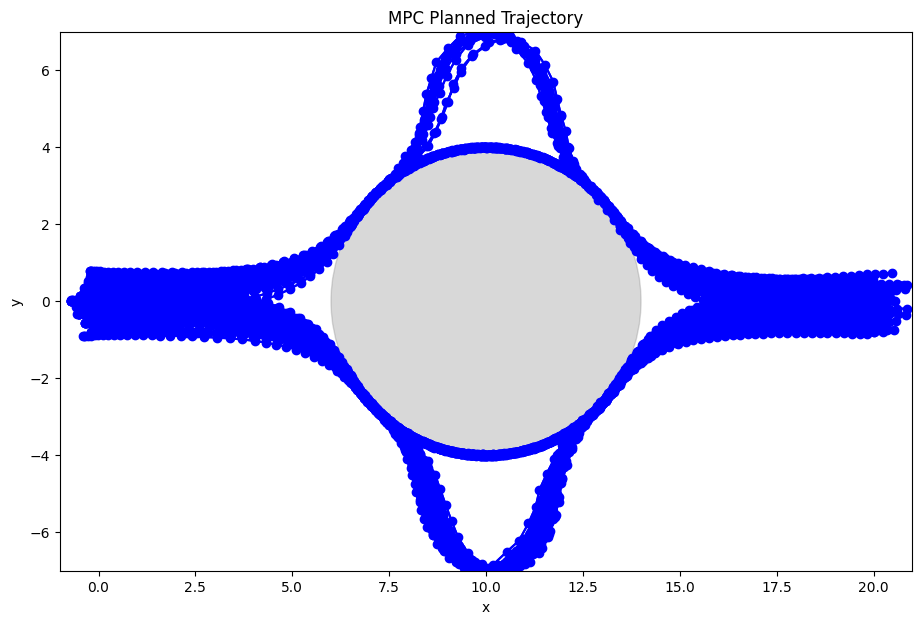

In [81]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_guidesample/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [86]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(0)

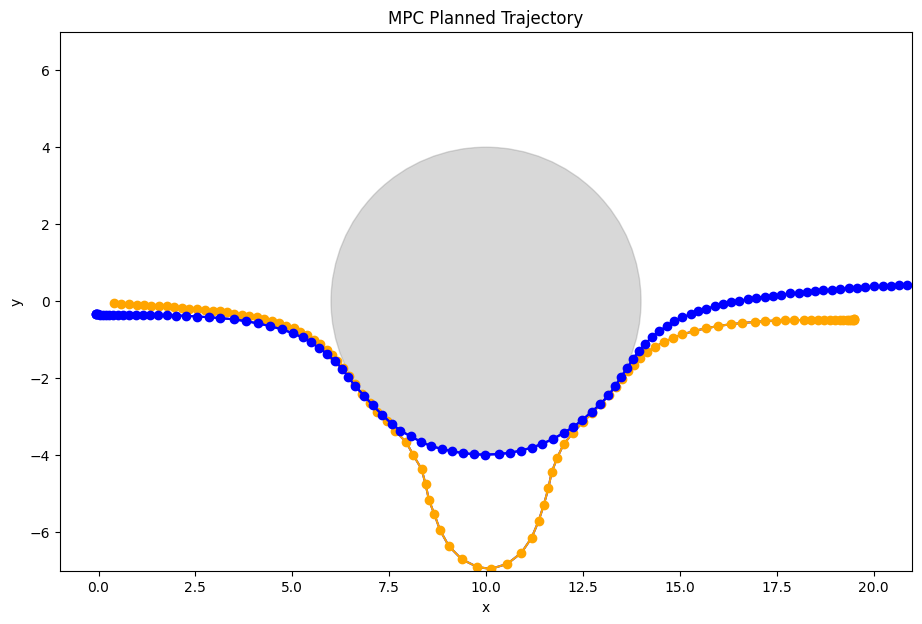

In [249]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

i = 99
data = np.load("sampled_trajs/mpc_P25E5_guidesample/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E5_guidesample/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [232]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1.99)

np.int64(0)

In [ ]:
#  Diffusion MPC P25E3 with old data and no sampling guidance

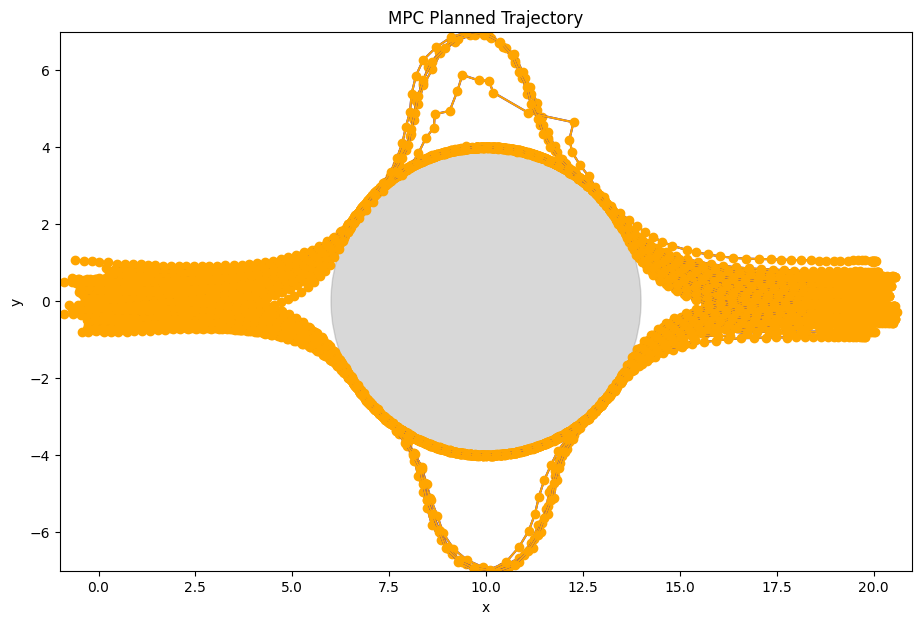

In [87]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_noguidance1/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

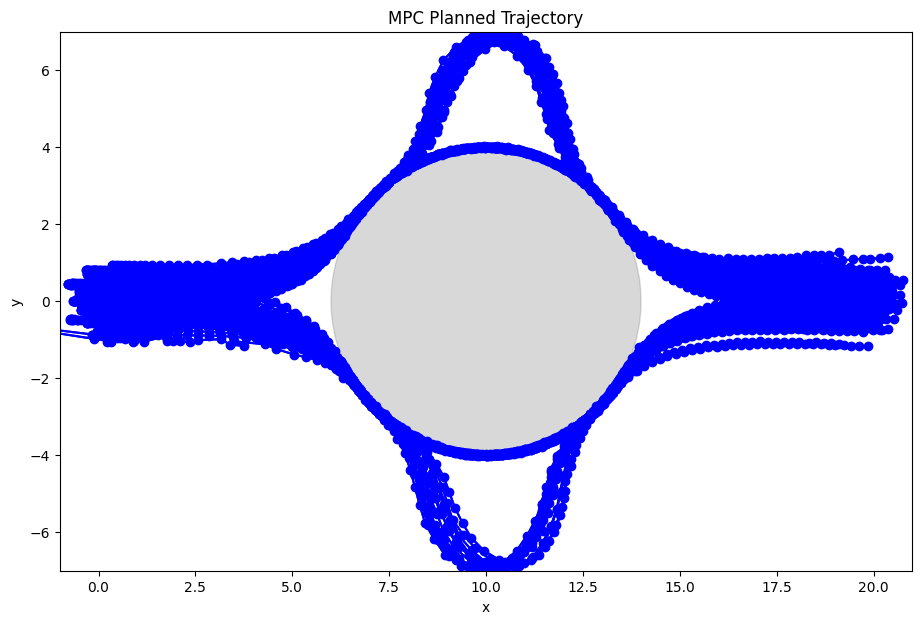

In [88]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_noguidance1/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [99]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(10)

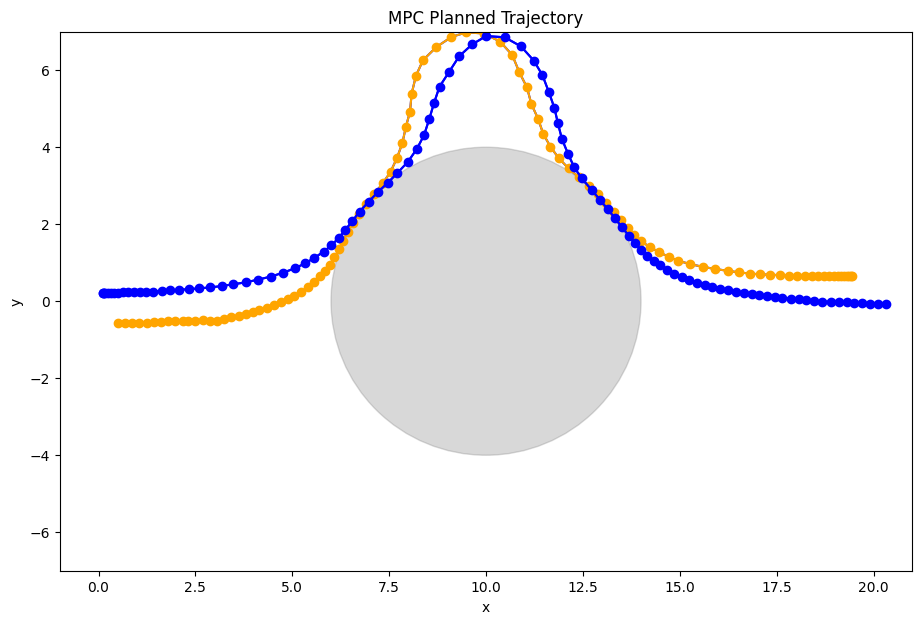

In [ ]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []
expert_data2 = []

# Head on collisions: 3, 30, 36, 54, 68, 70, 74, 75, 87, 99
i = 99
data = np.load("sampled_trajs/mpc_P25E3_noguidance1/mpc_traj1_%s.npy" % i)
expert_data1.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

data = np.load("sampled_trajs/mpc_P25E3_noguidance1/mpc_traj2_%s.npy" % i)
expert_data2.append(data)
plt.plot(data[:, 0], data[:, 1], 'b.-')
plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [ ]:
#  Diffusion MPC P25E3 with old data and no sampling guidance (2nd model)

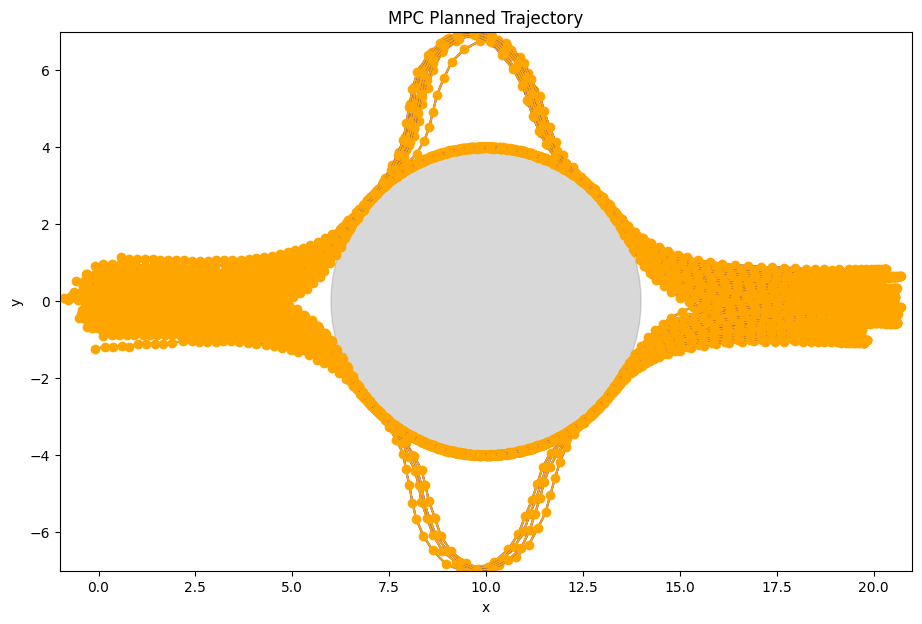

In [100]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_noguidance2/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

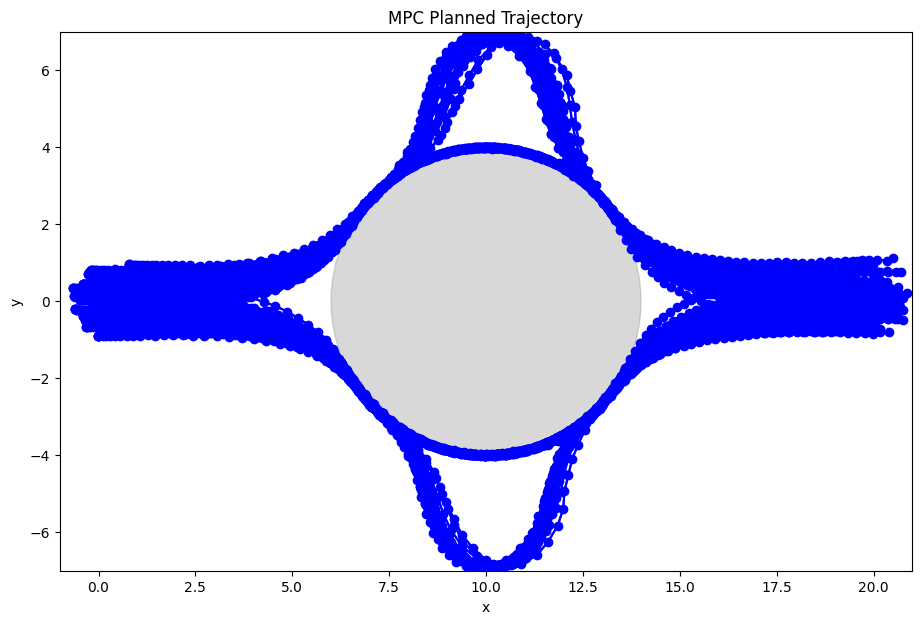

In [101]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_noguidance2/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [104]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(10)

In [ ]:
#  Diffusion MPC P25E5 with old data and no sampling guidance

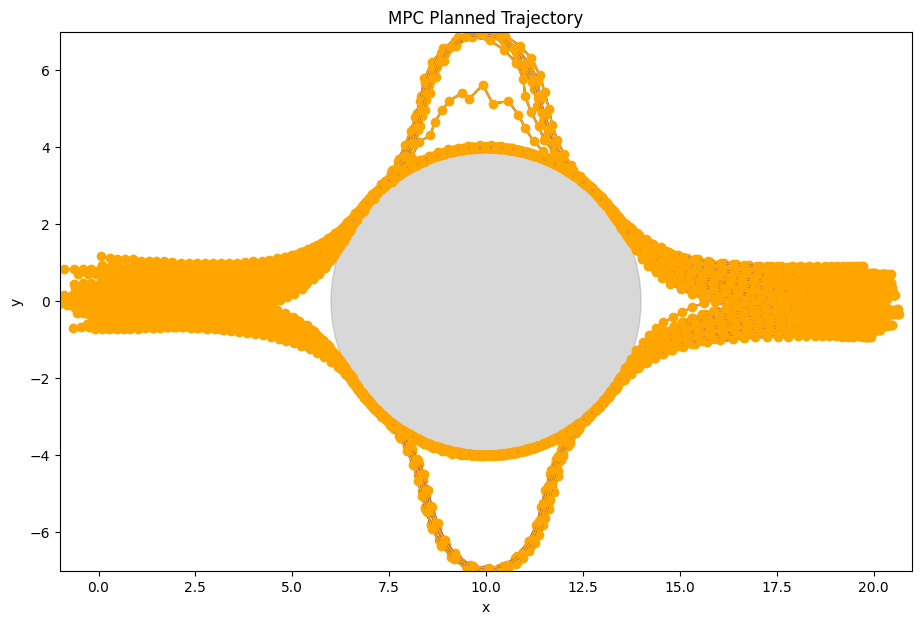

In [105]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_noguidance/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

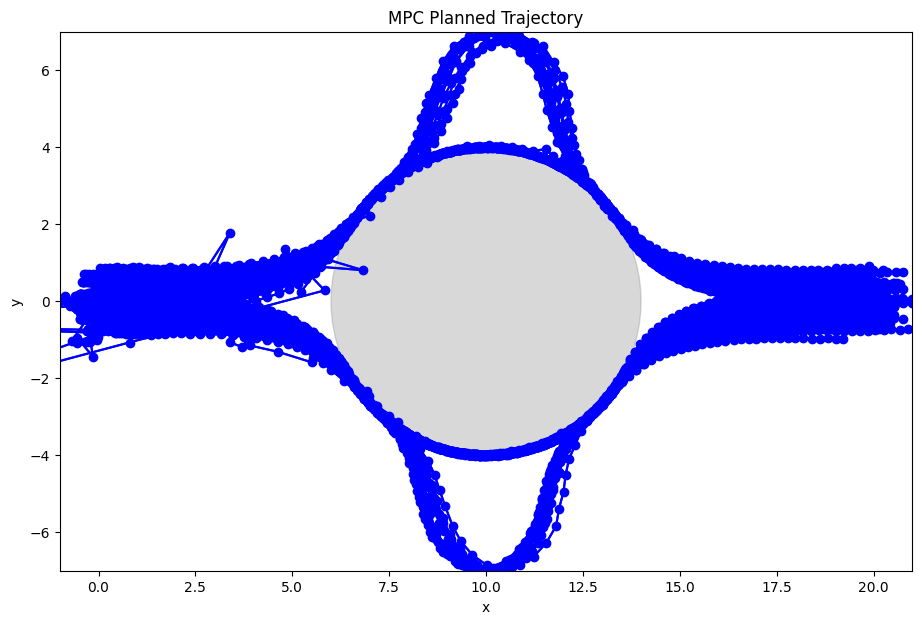

In [106]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_noguidance/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [111]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(8)

In [ ]:
#  Diffusion MPC P25E3 with old data and no sampling guidance and not conditioned on the other agents' final state

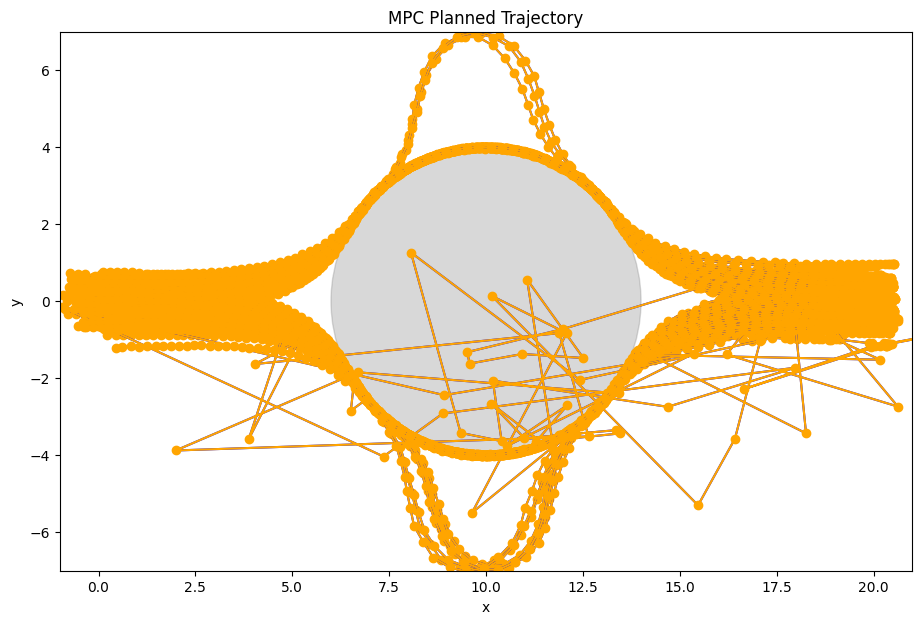

In [112]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

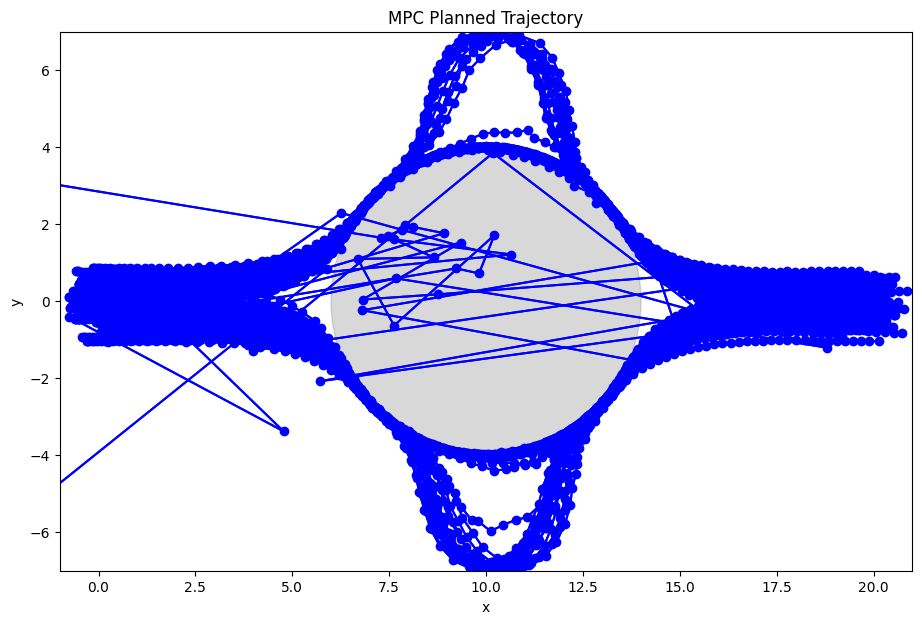

In [113]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [118]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(22)

In [ ]:
#  Diffusion MPC P25E3 with old data and no sampling guidance and not conditioned on the other agents' final state with larger model

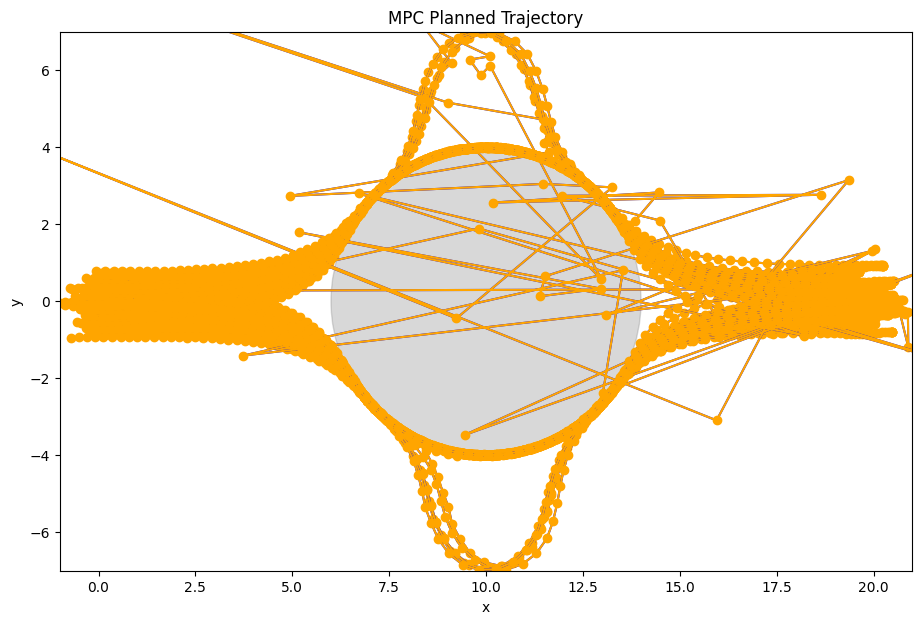

In [449]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond_bigger/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

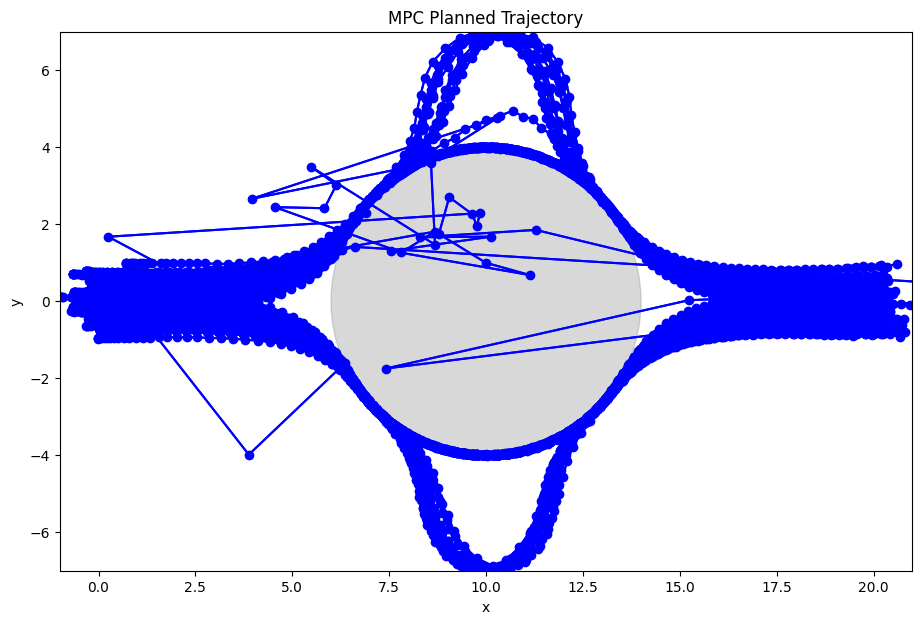

In [450]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond_bigger/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [451]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(18)

In [ ]:
#  Diffusion MPC P25E3 with old data and no sampling guidance and not conditioned on the other agents' final state

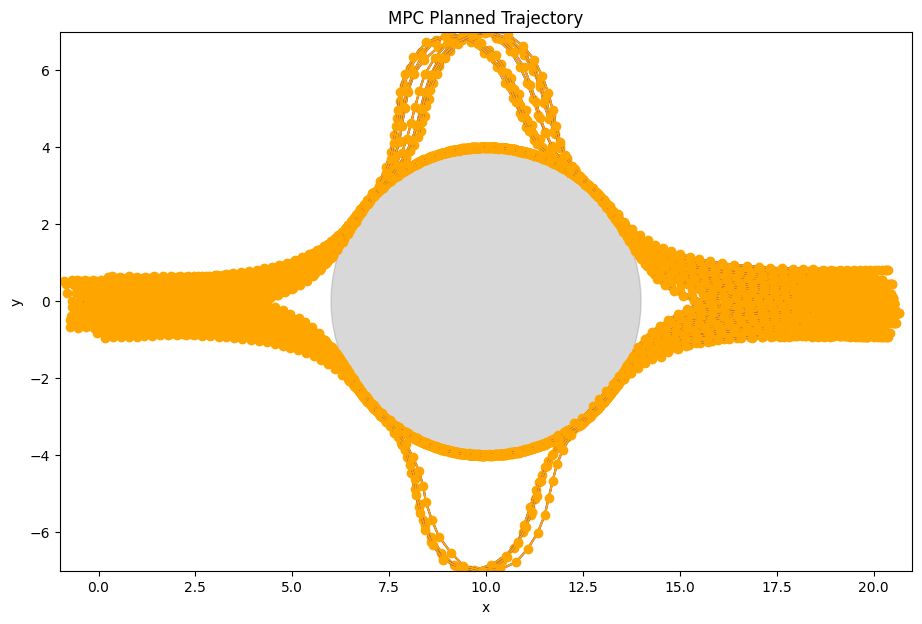

In [437]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond_guidesample2/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

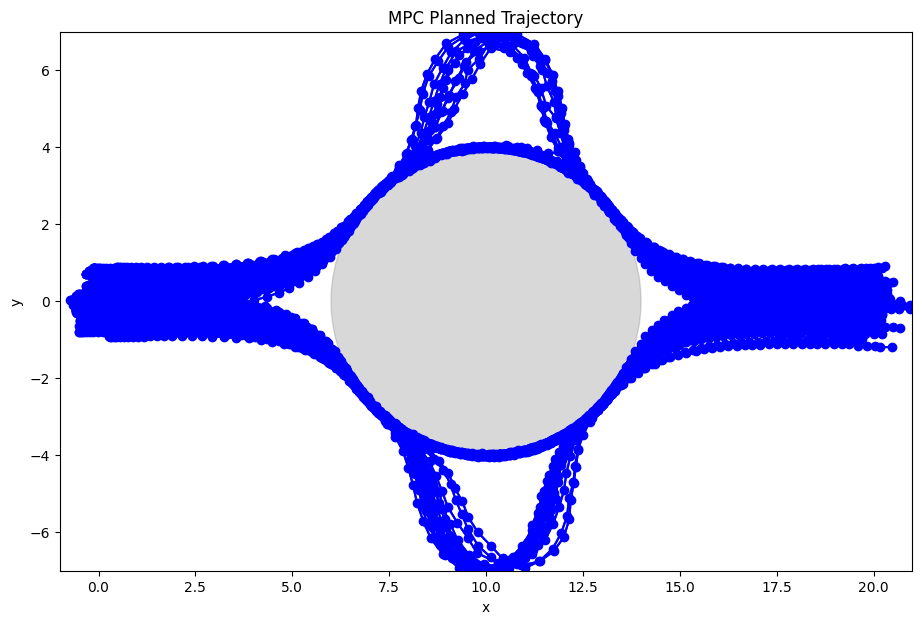

In [438]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E3_smallcond_guidesample2/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [439]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(24)

In [ ]:
#  Diffusion MPC P25E5 with old data and no sampling guidance and not conditioned on the other agents' final state

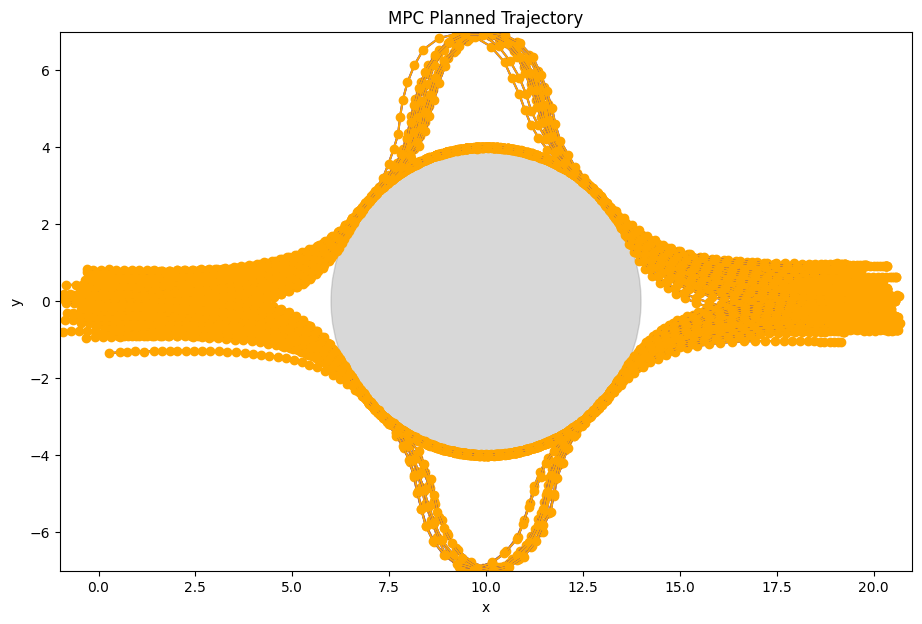

In [119]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_smallcond/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

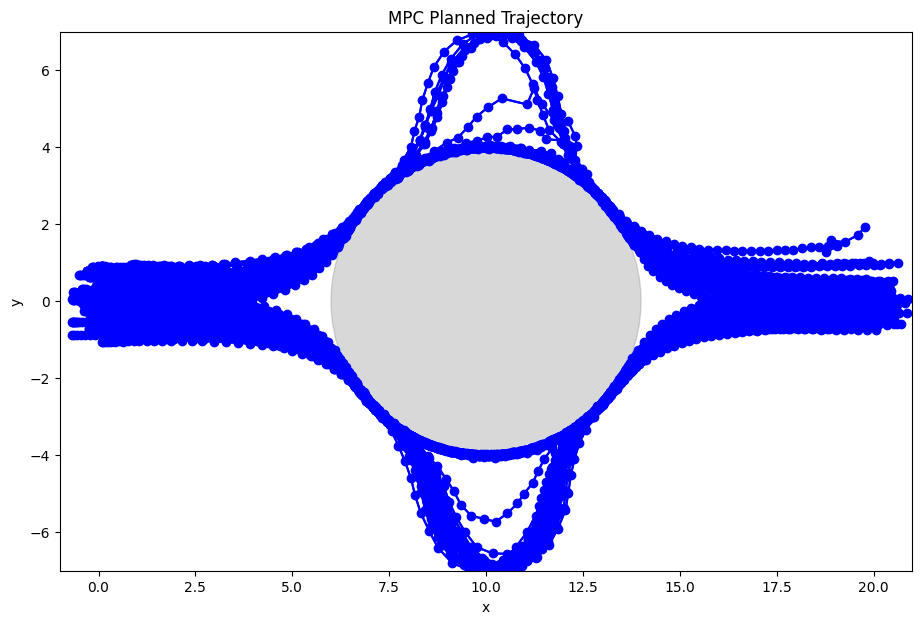

In [120]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_smallcond/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [128]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(13)

In [ ]:
#  Diffusion MPC P25E5 with old data with sampling guidance and not conditioned on the other agents' final state

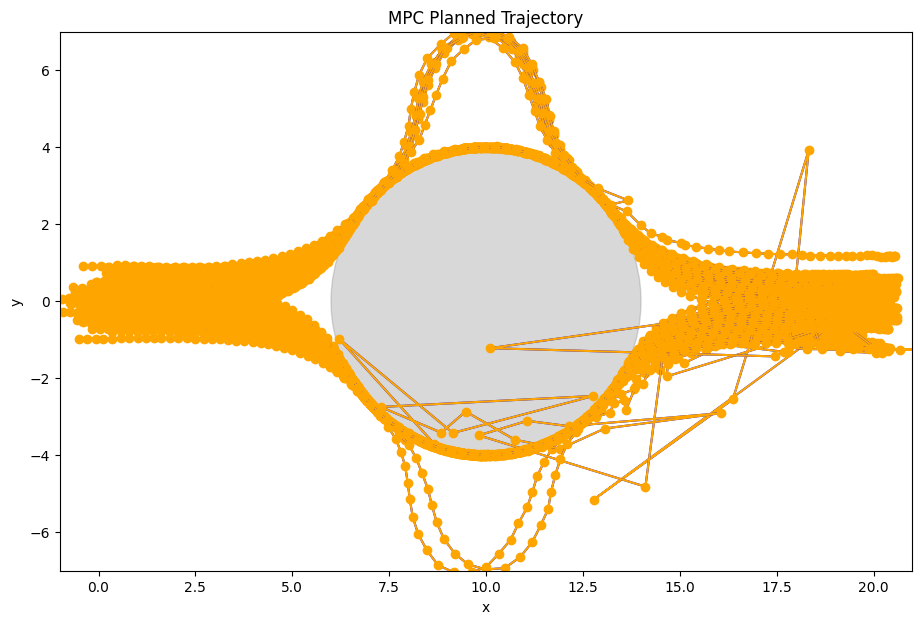

In [428]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_smallcond_guidesample/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

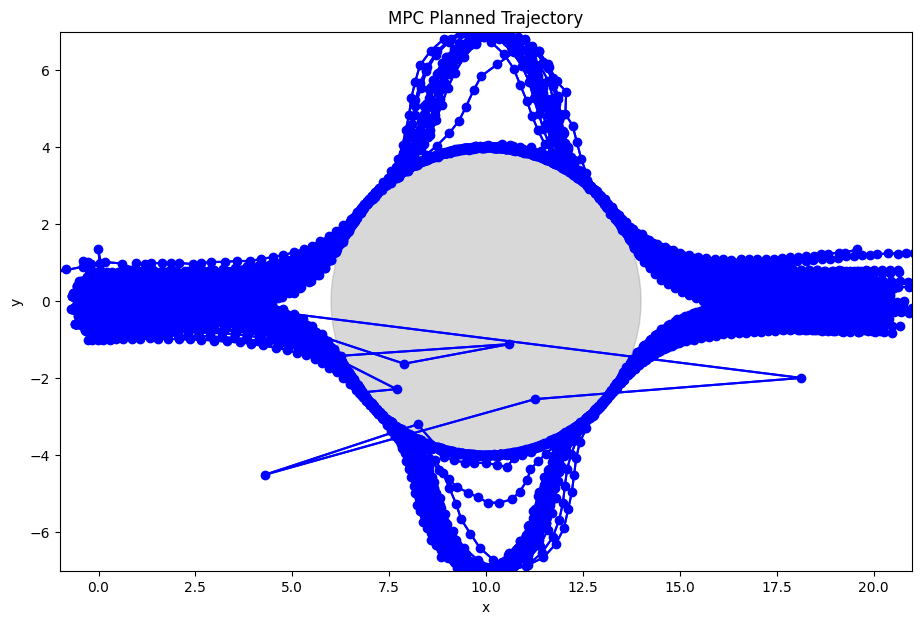

In [429]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_smallcond_guidesample/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [430]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(15)

In [ ]:
#  Diffusion MPC P25E5 with old data and conditioned on the leader's history and not the other agents' final state

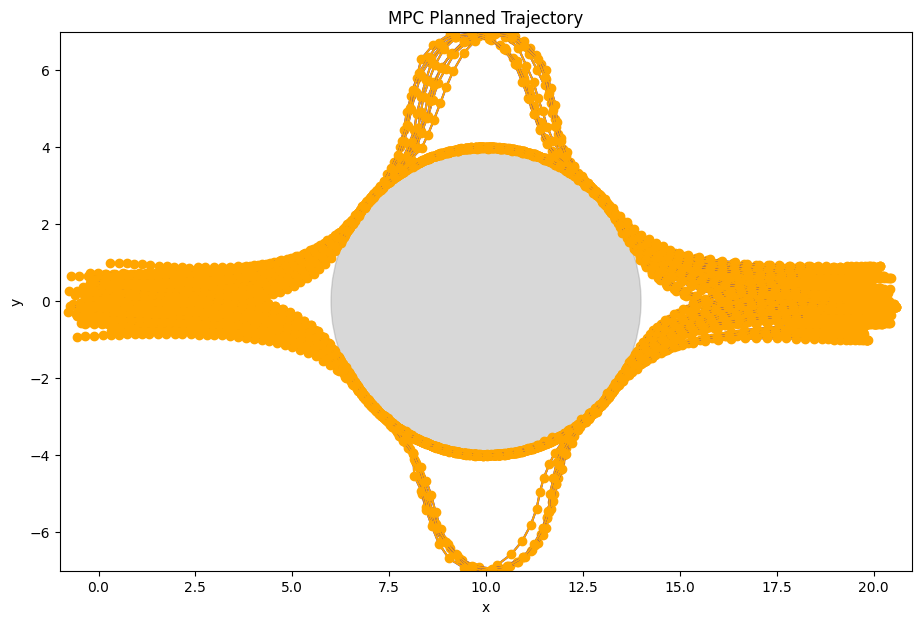

In [443]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E5/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

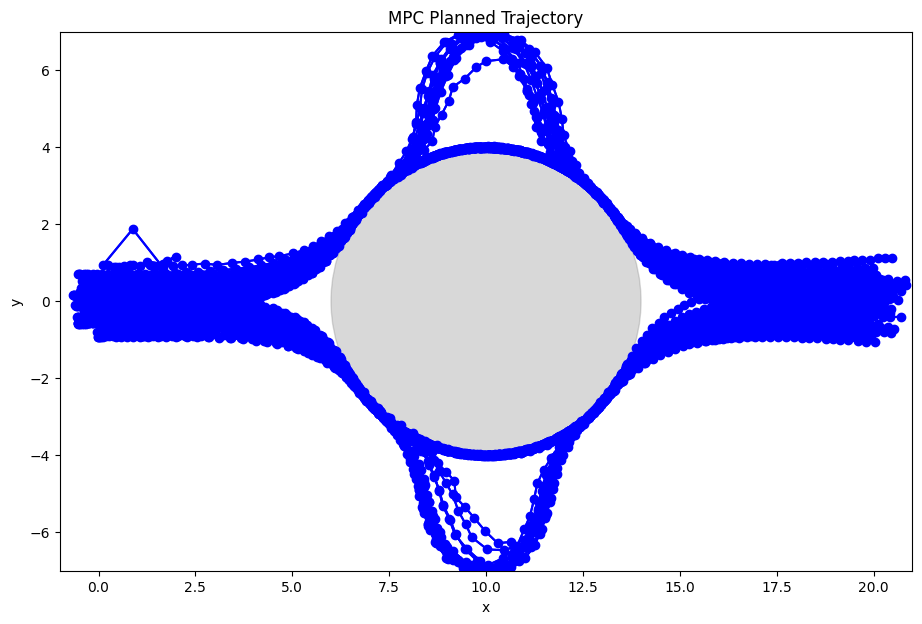

In [444]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E5/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [445]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(18)

In [ ]:
#  Diffusion MPC P25E3 with old data and conditioned on the leader's history and not the other agents' final state

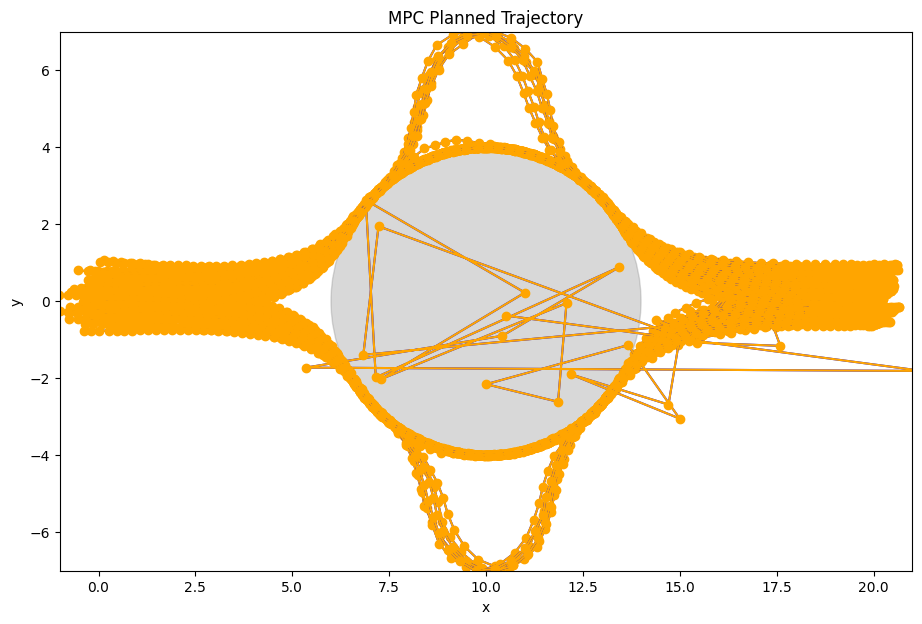

In [446]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E3/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

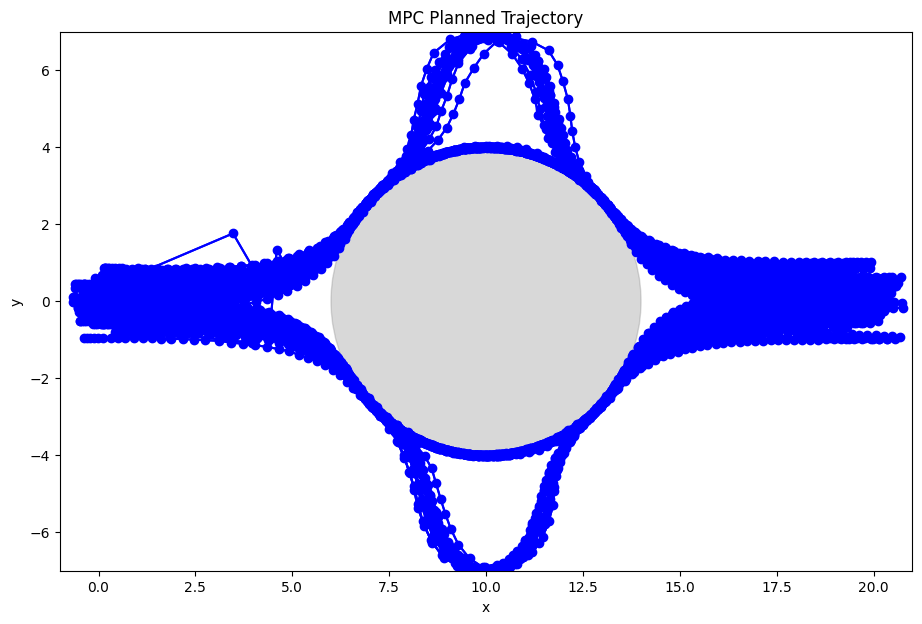

In [447]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E3/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [448]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(12)

In [ ]:
#  Diffusion MPC P25E3 with old data and conditioned on the leader's history and not the other agents' final state with larger model

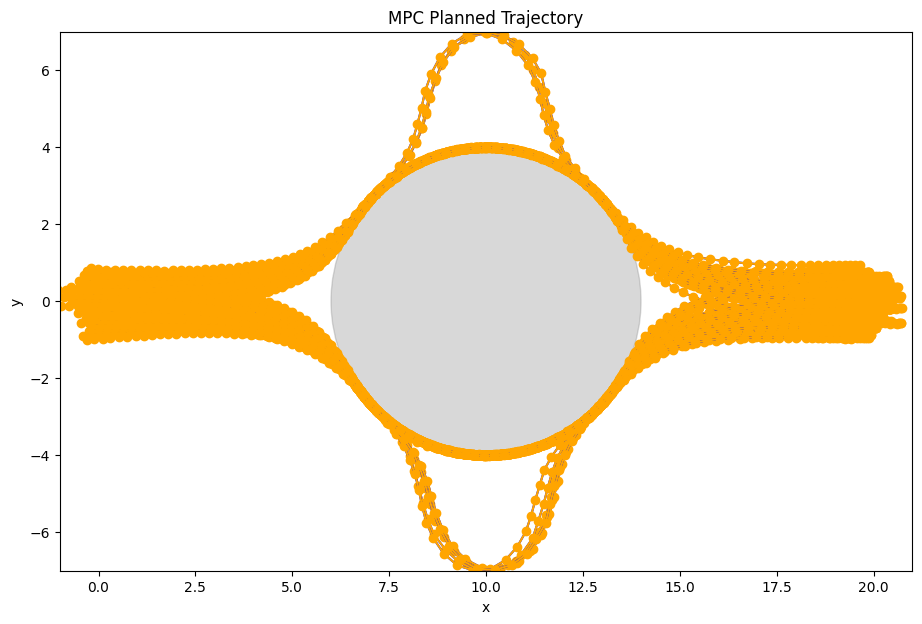

In [453]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E3_bigger/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

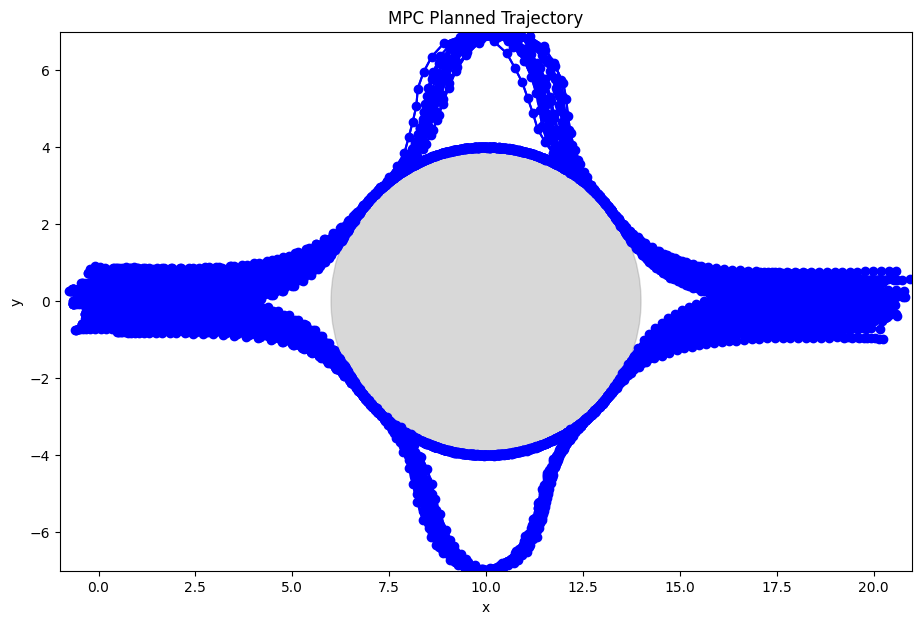

In [454]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_latenttrain_P25E3_bigger/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [455]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=1)

np.int64(14)

In [ ]:
#  Vanilla CTDE Diffusion MPC P25E5

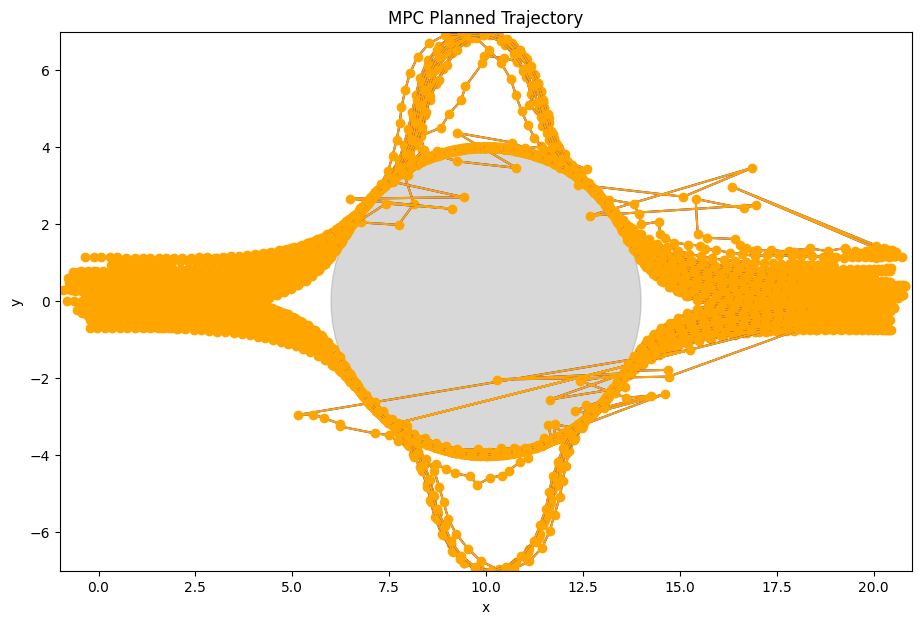

In [129]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_vanillaCTDE/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

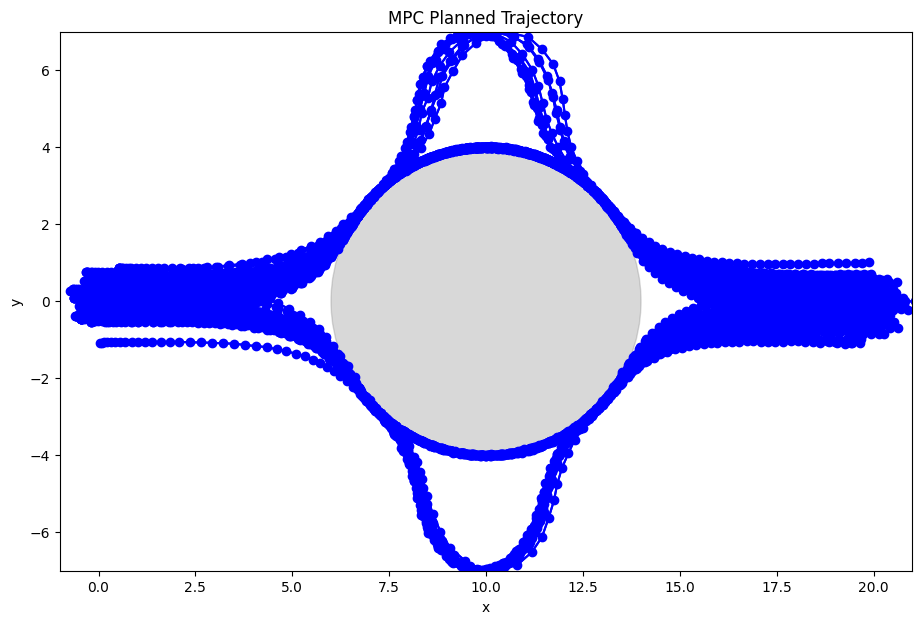

In [130]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E5_vanillaCTDE/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [135]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(35)

In [ ]:
#  Vanilla CTDE Diffusion MPC P25E1

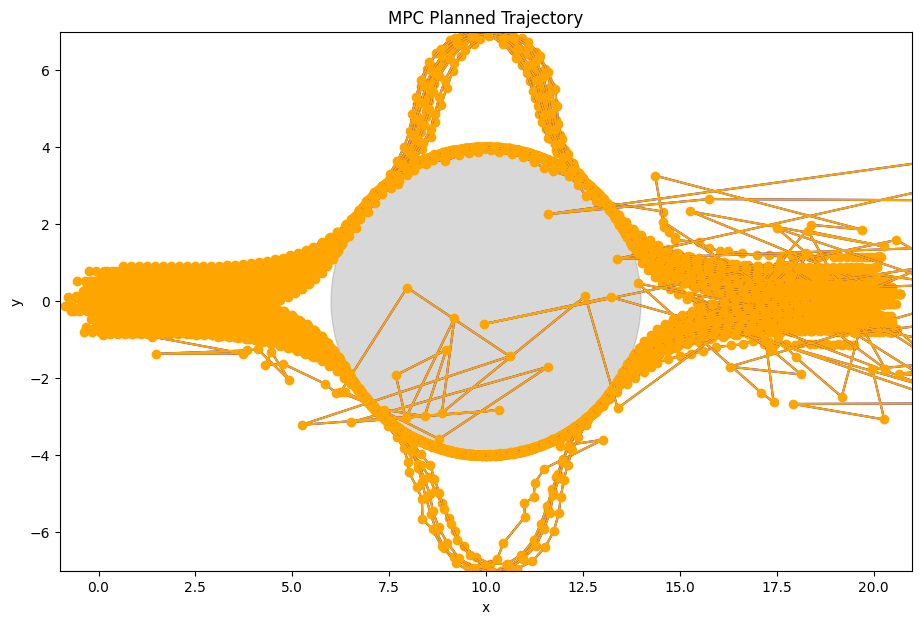

In [70]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

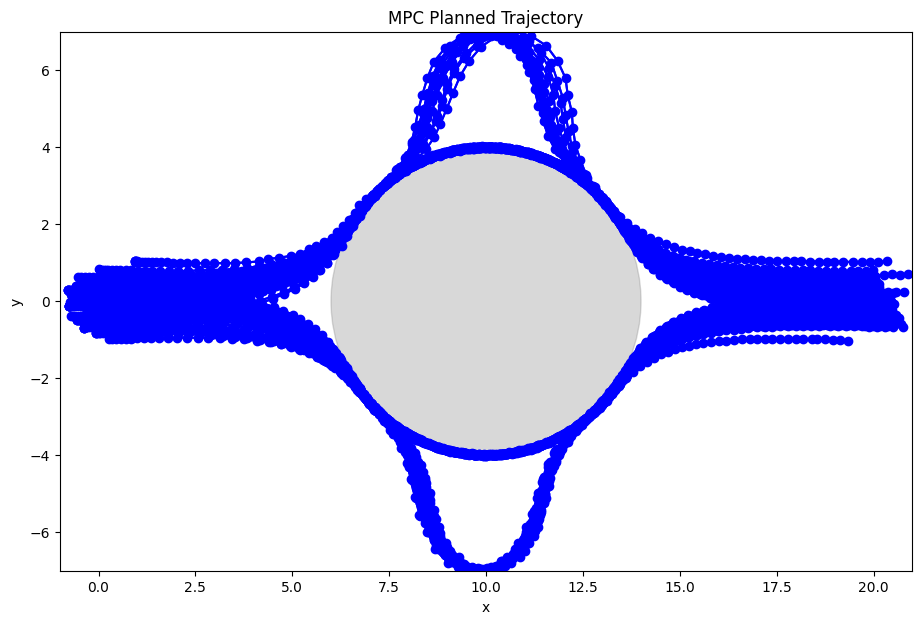

In [71]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

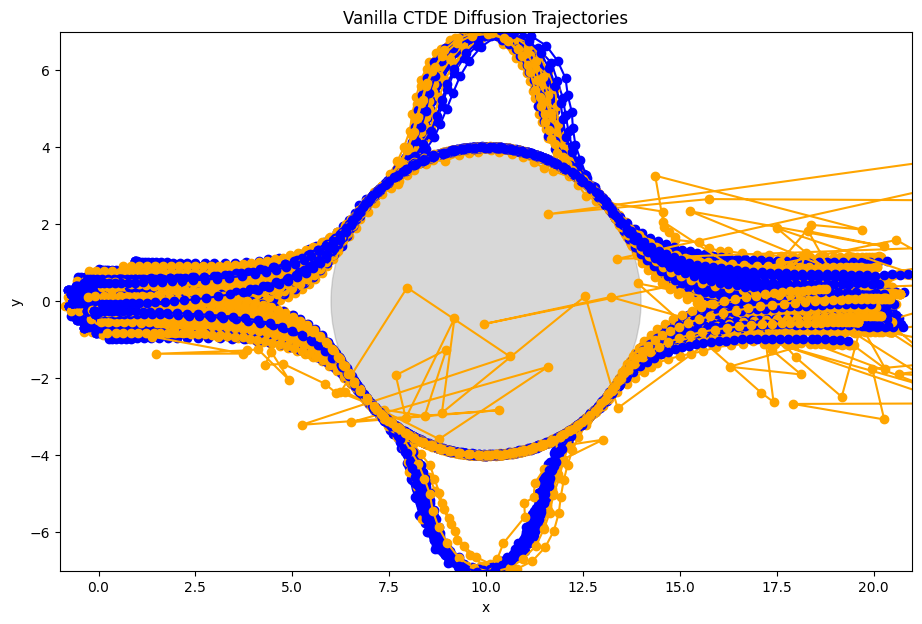

In [72]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Vanilla CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [45]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(32)

In [74]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

1

In [80]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.9, radius=3.6)

53

In [146]:
#  Vanilla CTDE Diffusion MPC P25E1 larger model

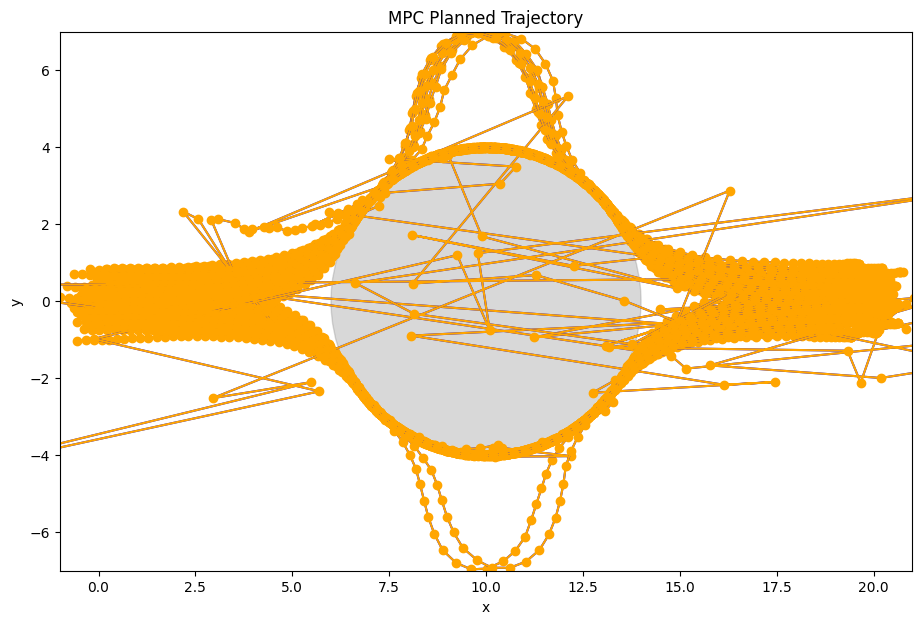

In [147]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE_final/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

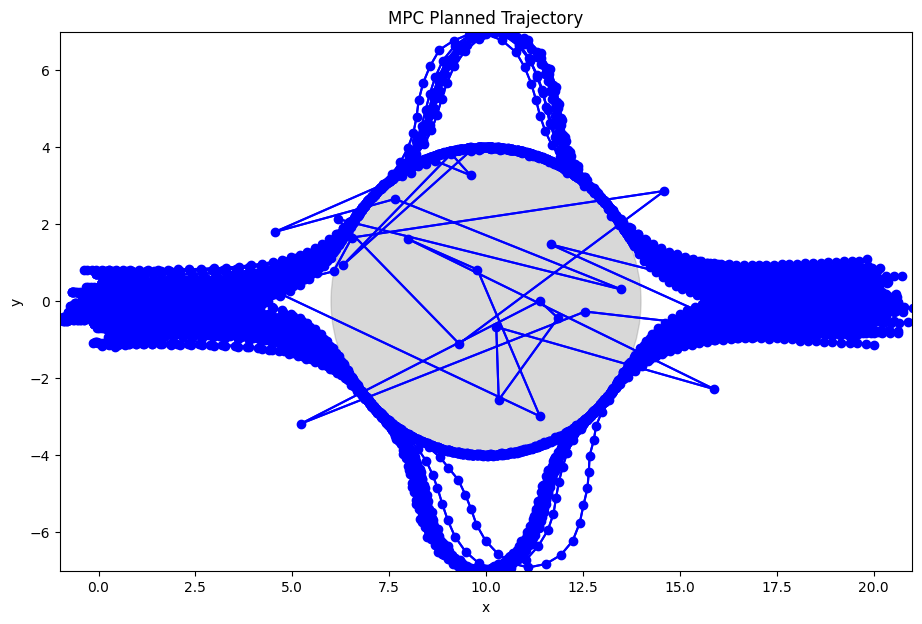

In [148]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE_final/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

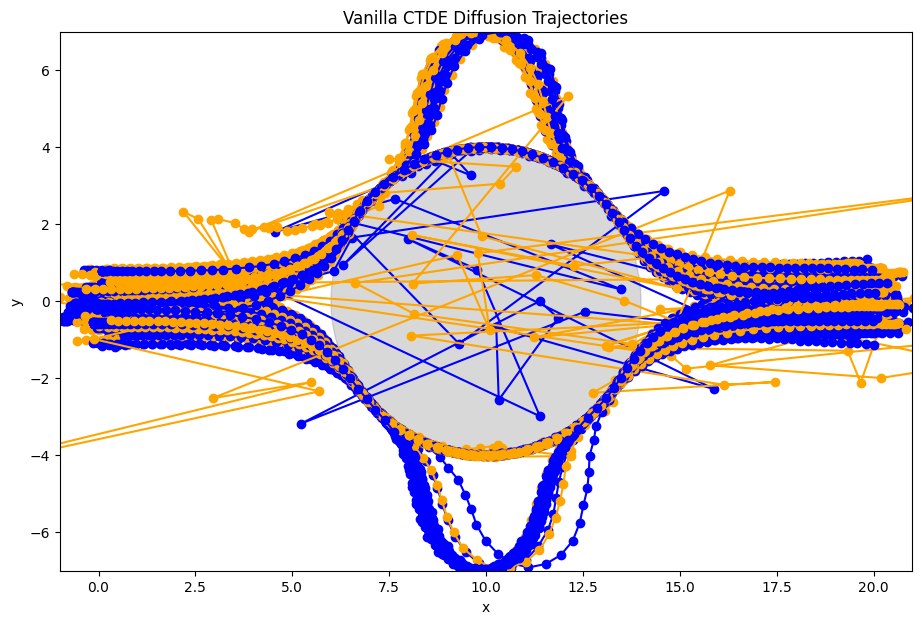

In [149]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Vanilla CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [150]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(31)

In [152]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

3

In [153]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.9, radius=3.6)

50

In [1]:
# CTDE Diffusion MPC P25E1 with no leader follower

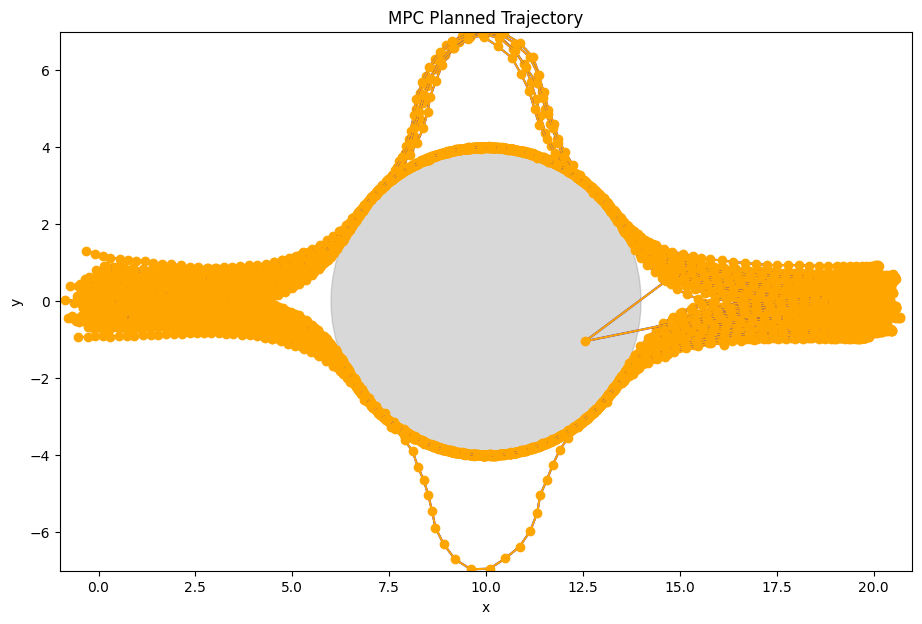

In [136]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

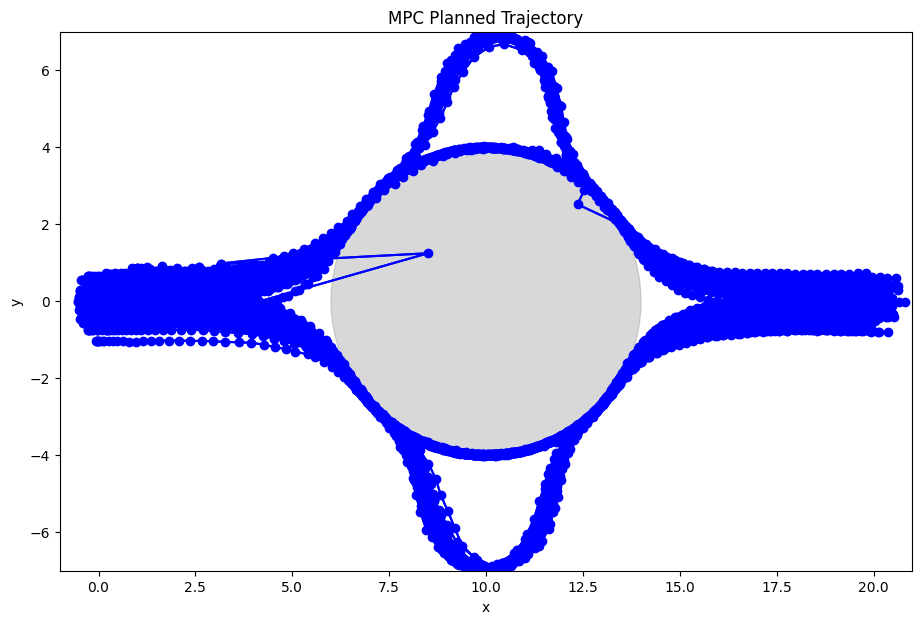

In [137]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [ ]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(8)

In [1]:
# CTDE Diffusion MPC P25E1 with no leader follower revised sampling so conditioned on same timestep

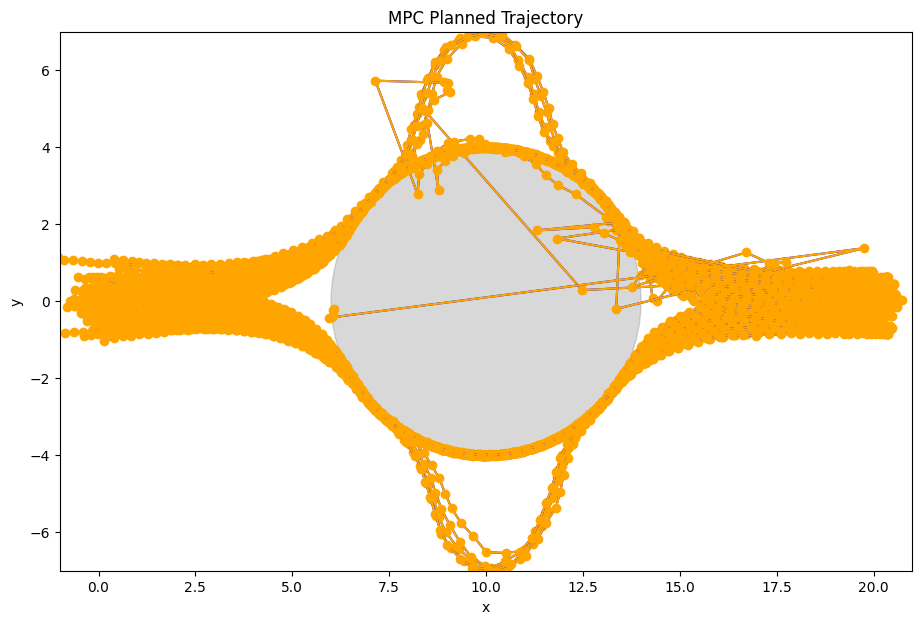

In [154]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_redo/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

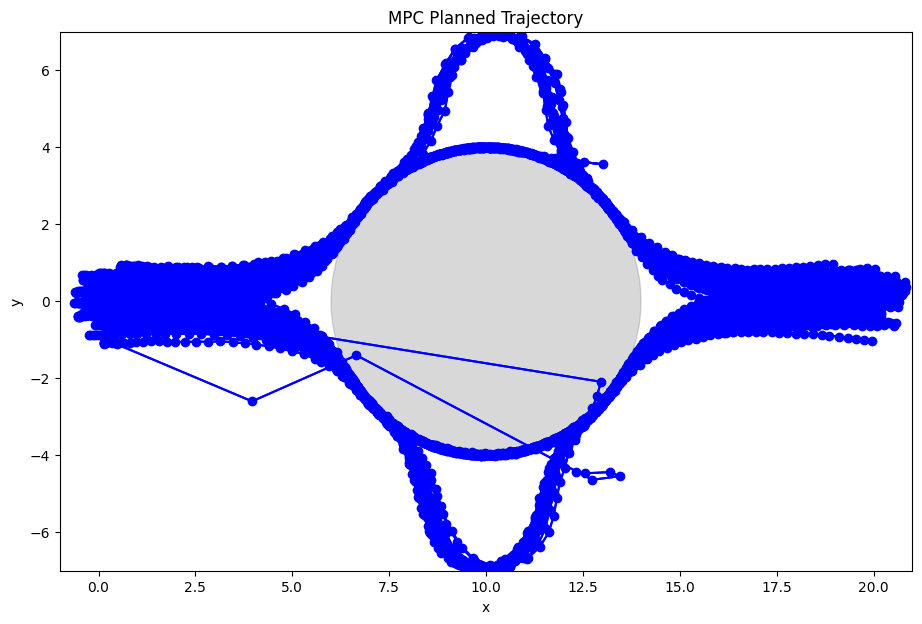

In [155]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_redo/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

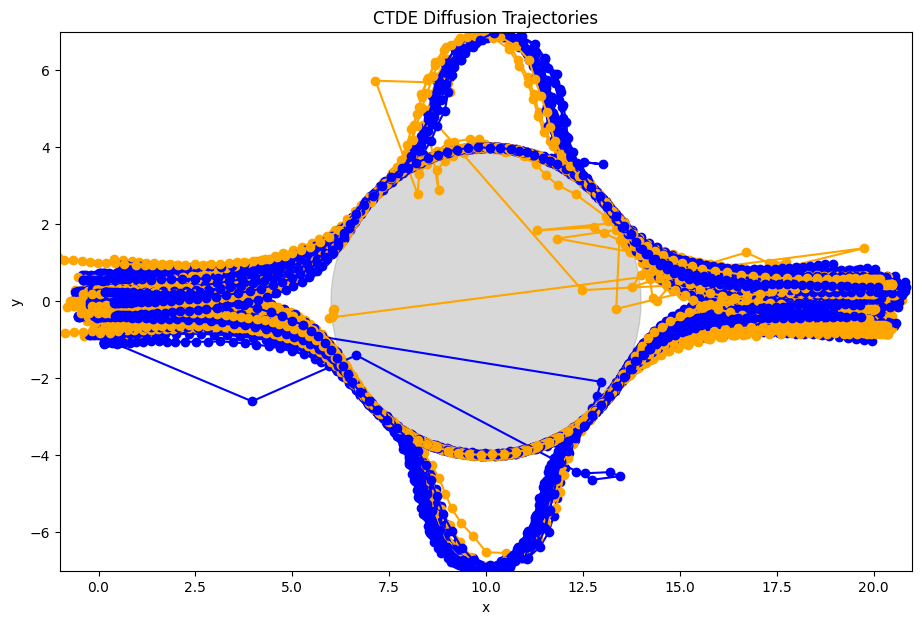

In [156]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [157]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(8)

In [85]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

2

In [91]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

48

In [139]:
# CTDE Diffusion MPC P25E1 with no leader follower revised sampling so conditioned on same timestep larger model

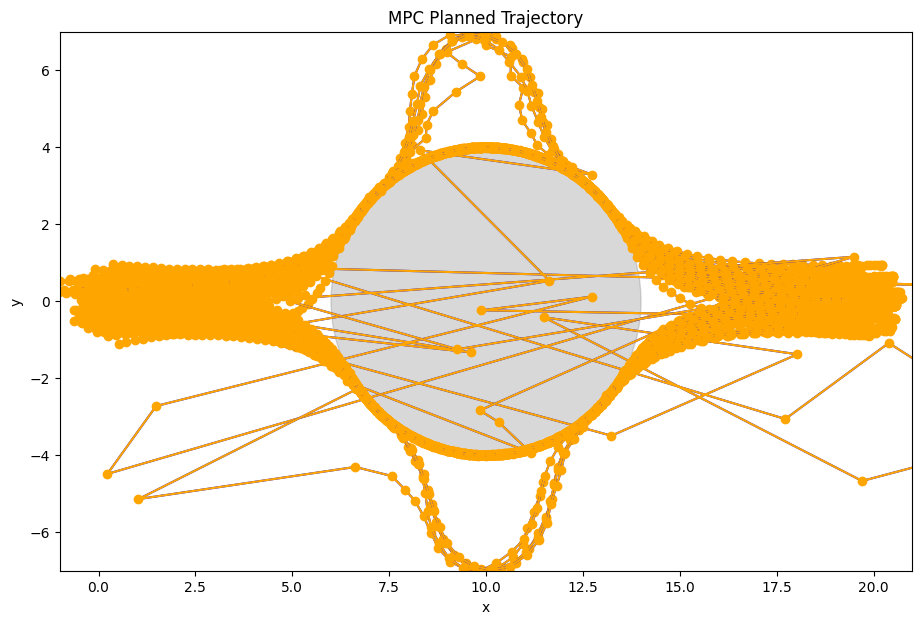

In [140]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_final/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

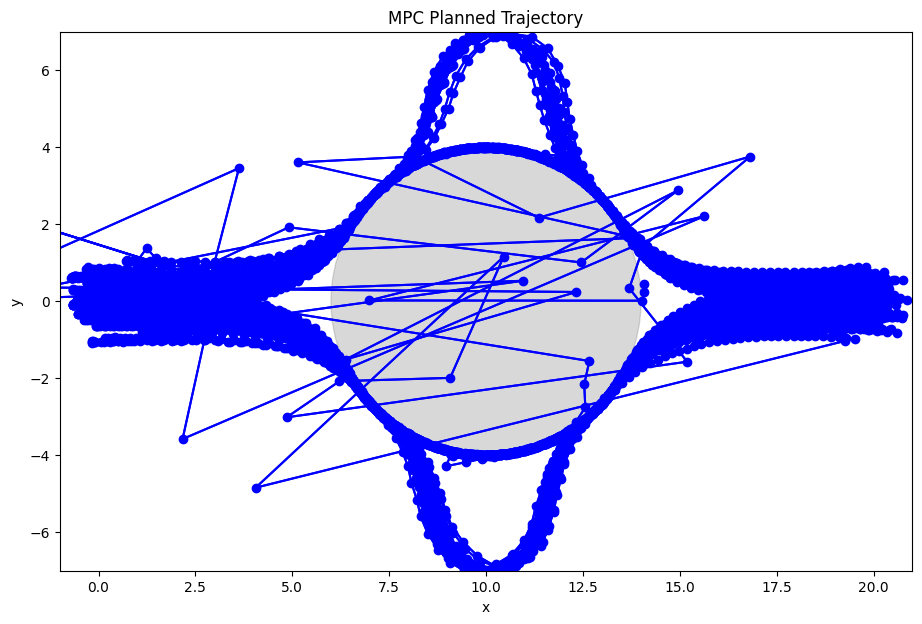

In [141]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_final/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

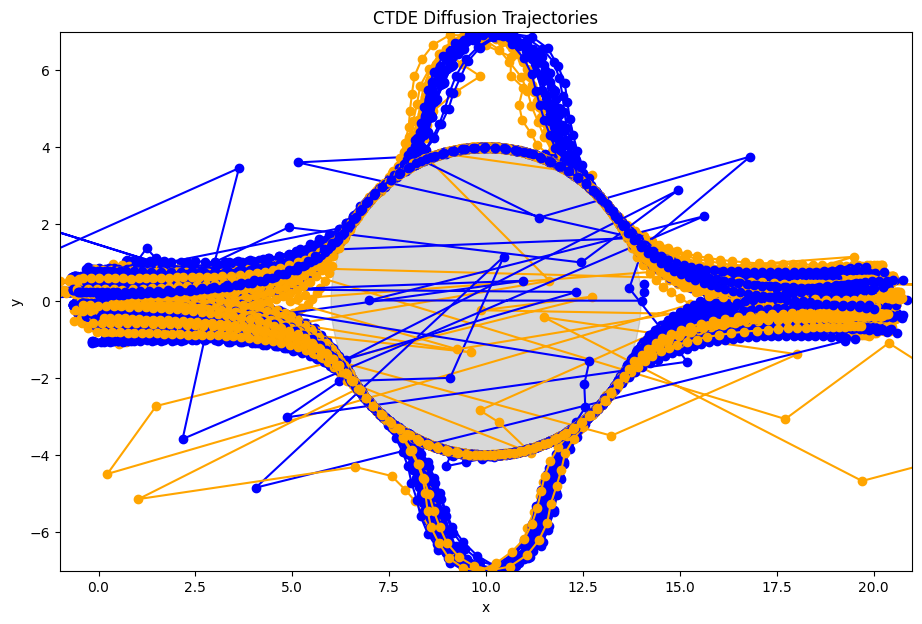

In [142]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [143]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(13)

In [144]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

3

In [145]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

50

In [1]:
# BC

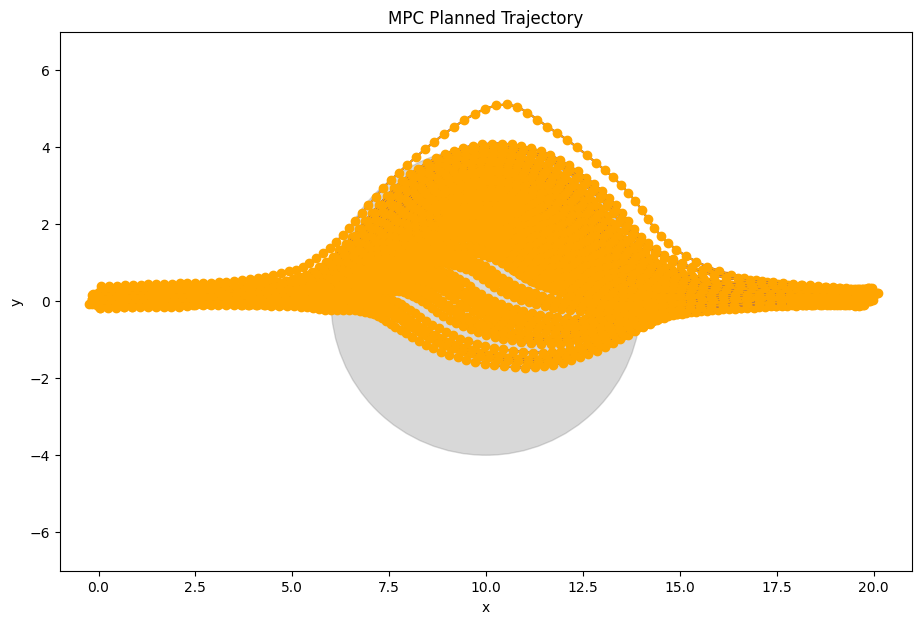

In [92]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/bc/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

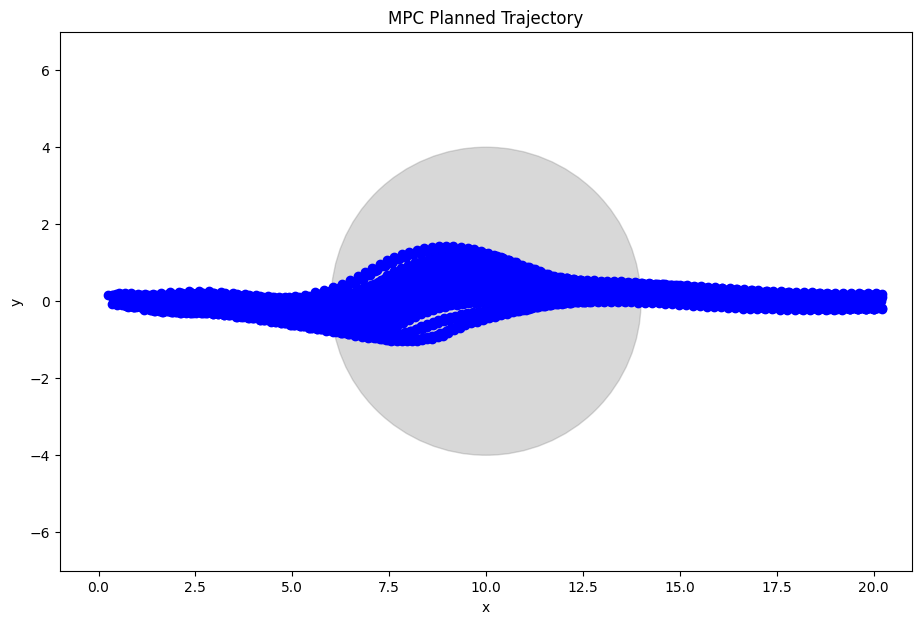

In [93]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/bc/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

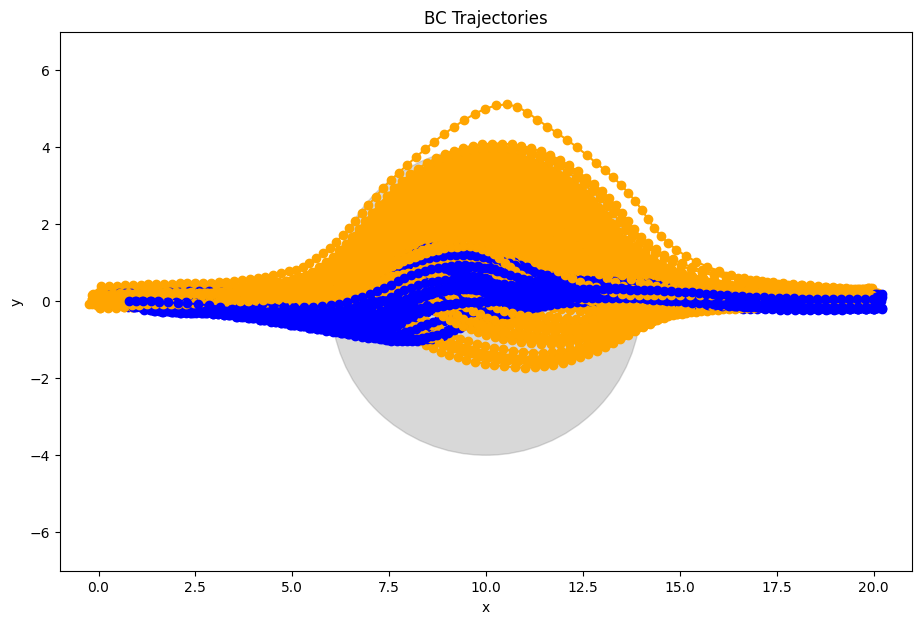

In [94]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("BC Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [100]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99)

np.int64(73)

In [102]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.99)

100

In [110]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

100

In [28]:
# MAGAIL Vary Init

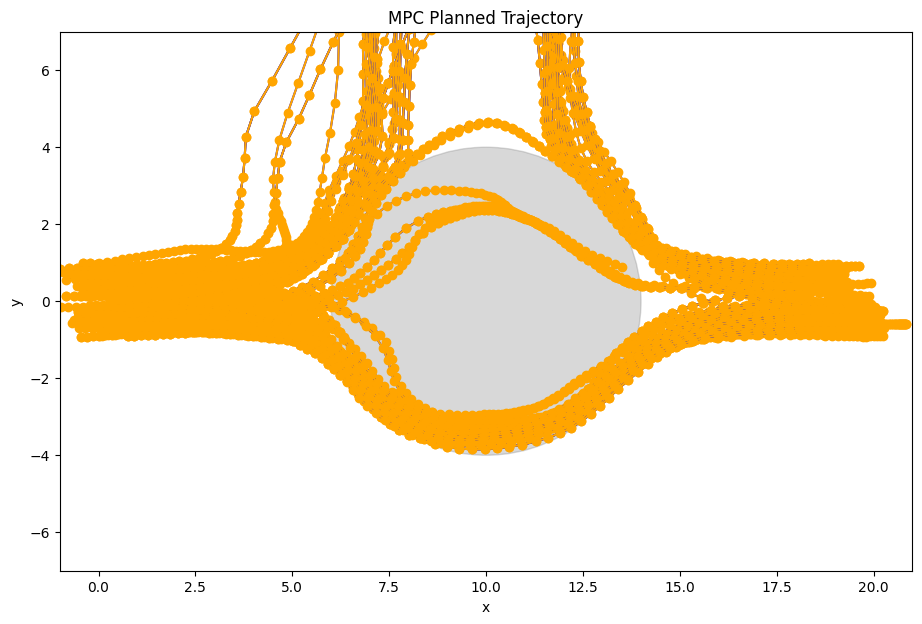

In [111]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_ctde/vary_init/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

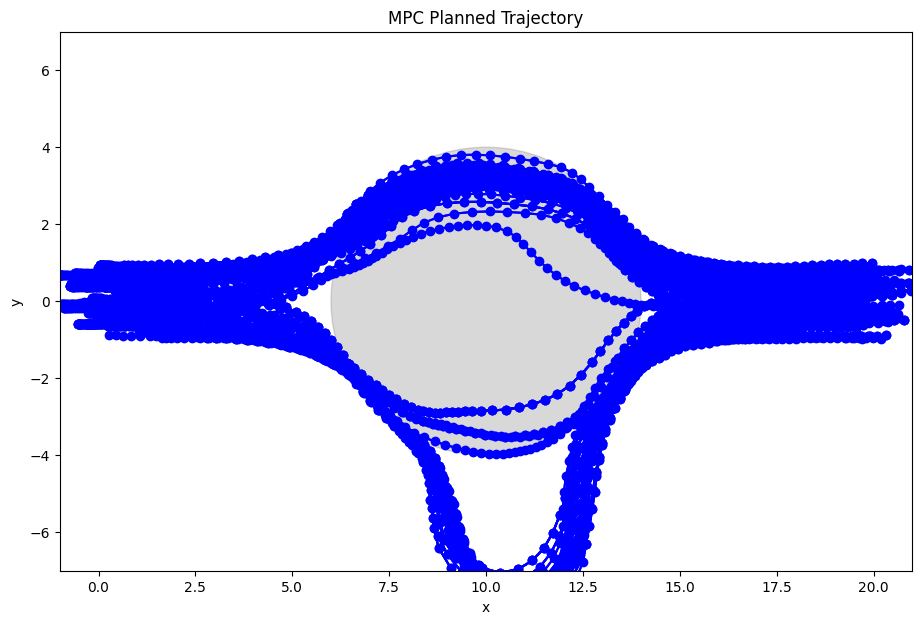

In [112]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_ctde/vary_init/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

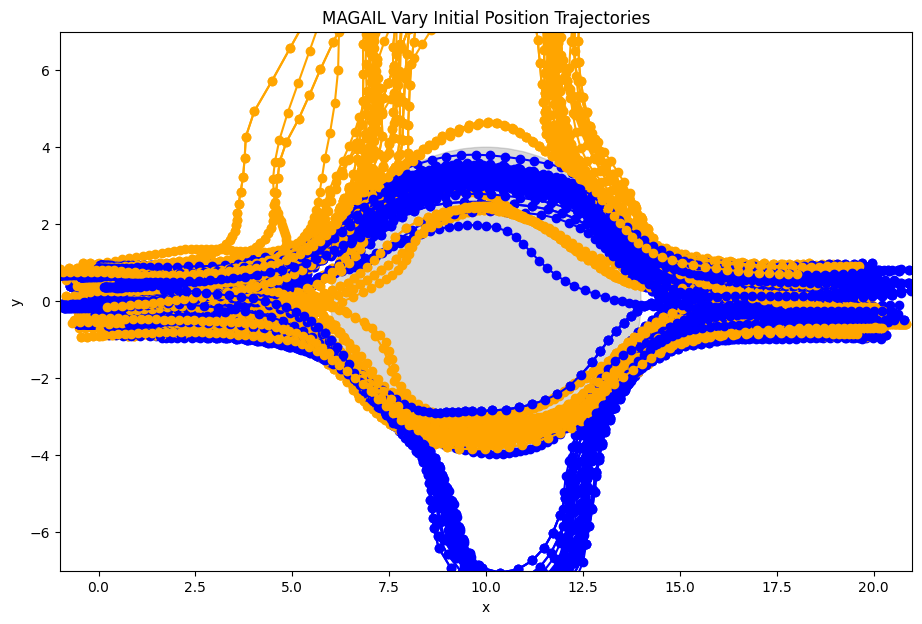

In [113]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MAGAIL Vary Initial Position Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [119]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99)

np.int64(24)

In [121]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

84

In [127]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

85

In [36]:
# MAGAIL Static Init

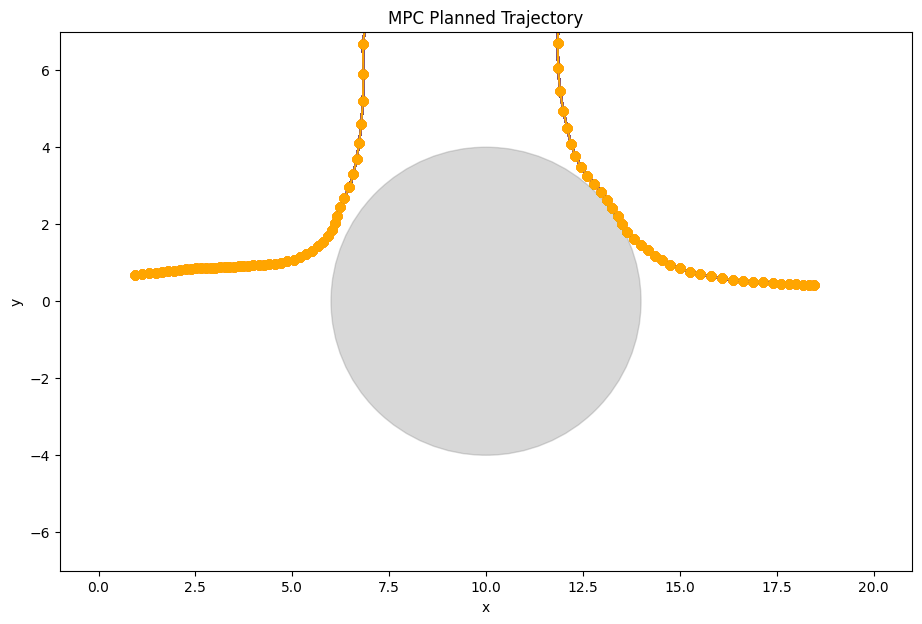

In [128]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_ctde/static_init/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

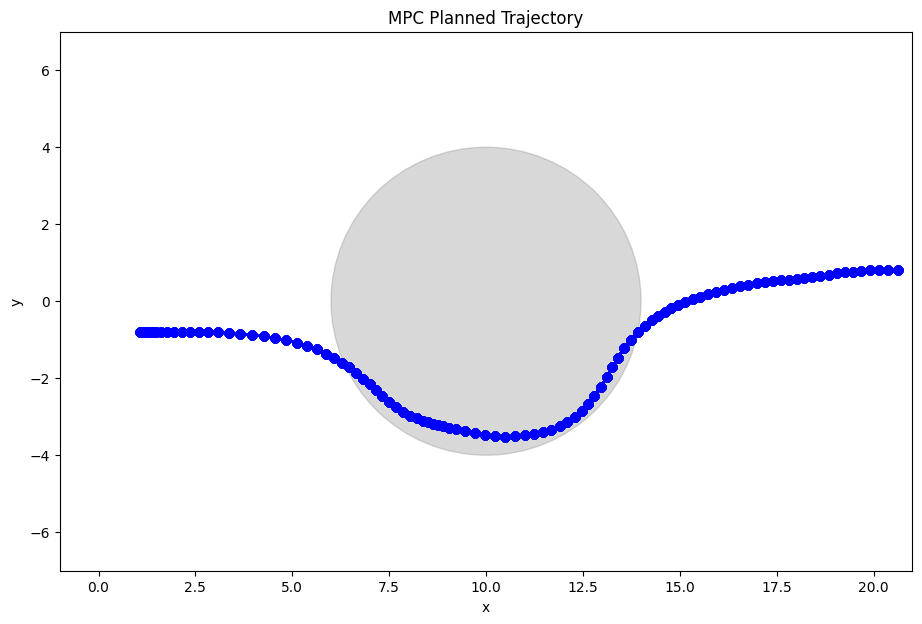

In [129]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_ctde/static_init/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

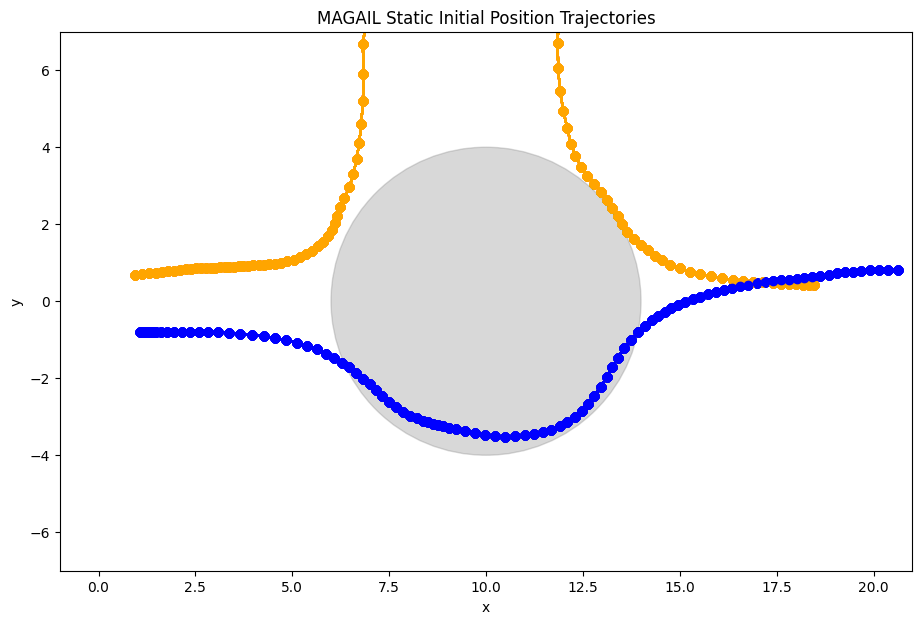

In [130]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MAGAIL Static Initial Position Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [132]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99)

np.int64(0)

In [134]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

100

In [138]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.66)

100

In [5]:
# Ours No Final Position

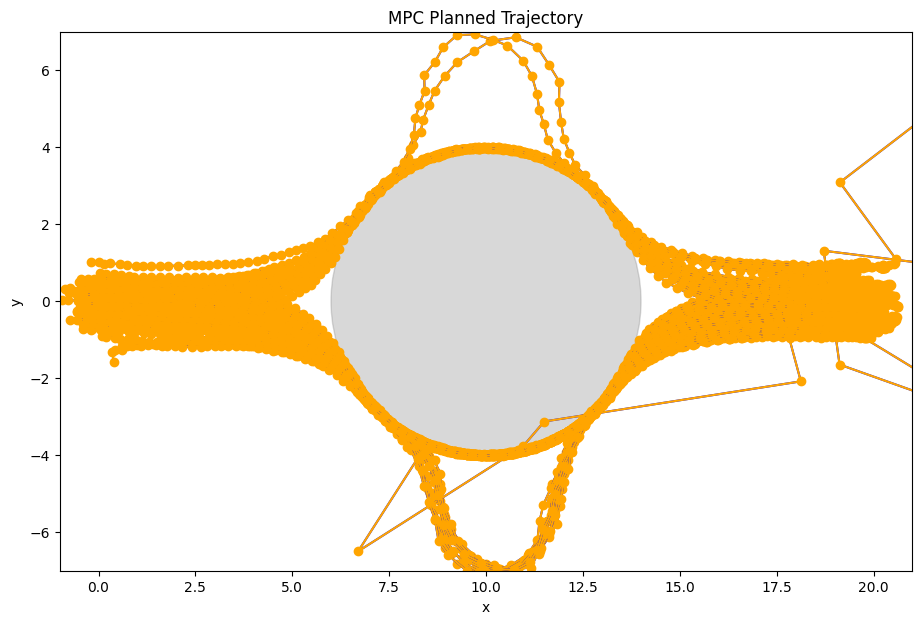

In [6]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_nofinalpos/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

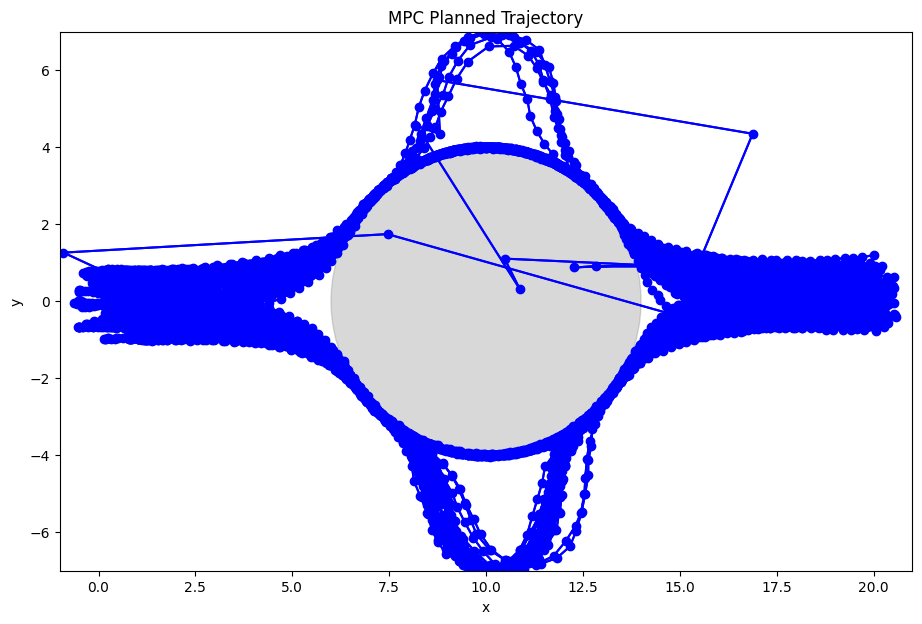

In [7]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_nofinalpos/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

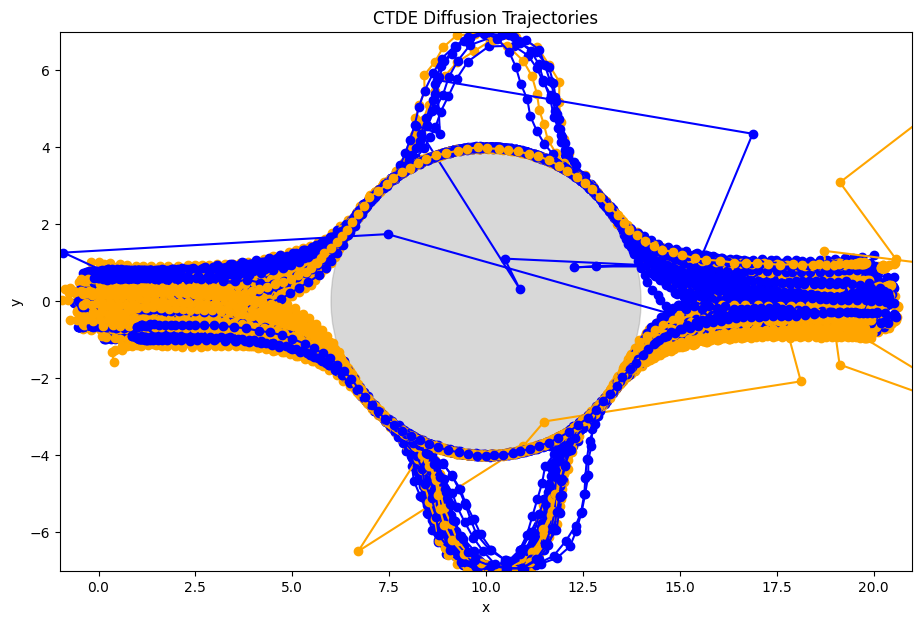

In [8]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [9]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=0.75)

np.int64(8)

In [10]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

1

In [11]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.99, radius=3.6)

41

In [ ]:
# Ours No Final Position Match Training

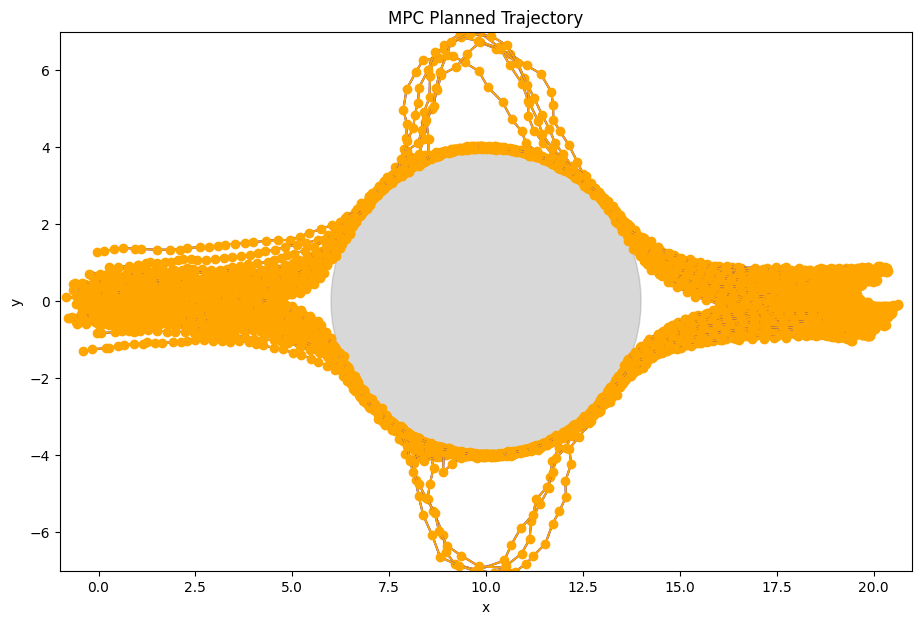

In [24]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_nofinalpos_matchtrain_50k/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

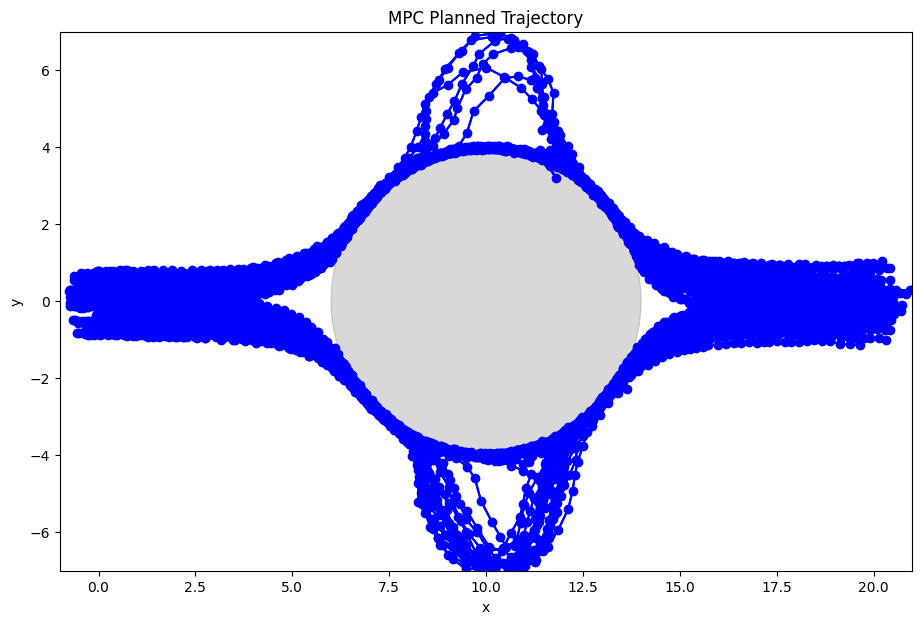

In [25]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_nolf_nofinalpos_matchtrain_50k/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

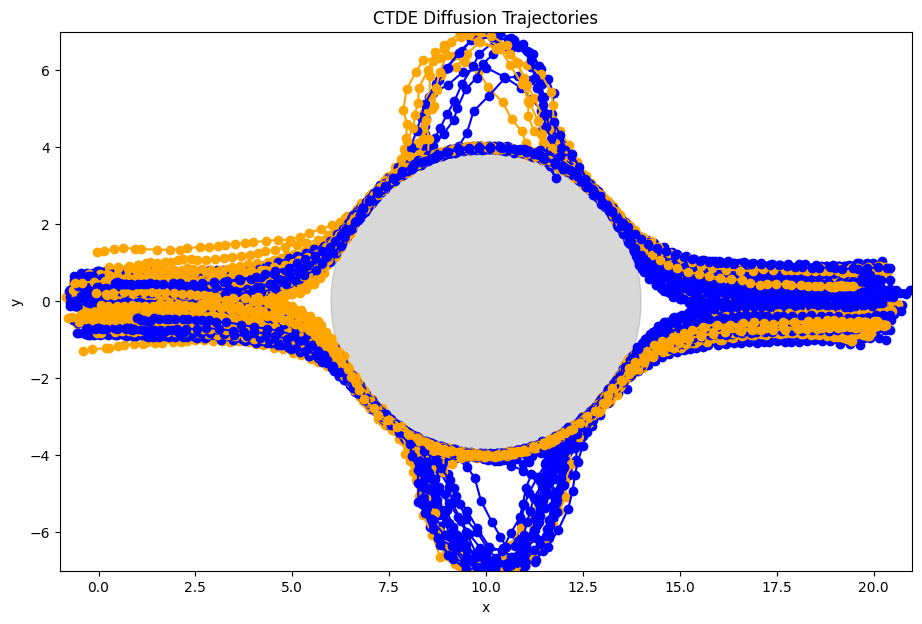

In [26]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [27]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(21)

In [28]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

0

In [29]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7, radius=3.6)

21

In [ ]:
# Vanilla CTDE No Final Position Match Training

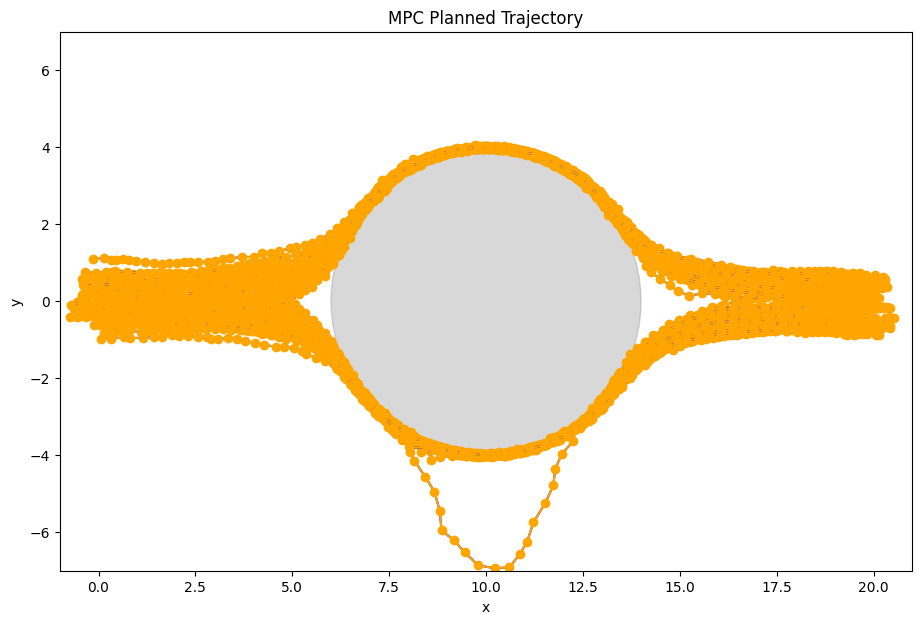

In [17]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE_nofinalpos_matchtrain_50k/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

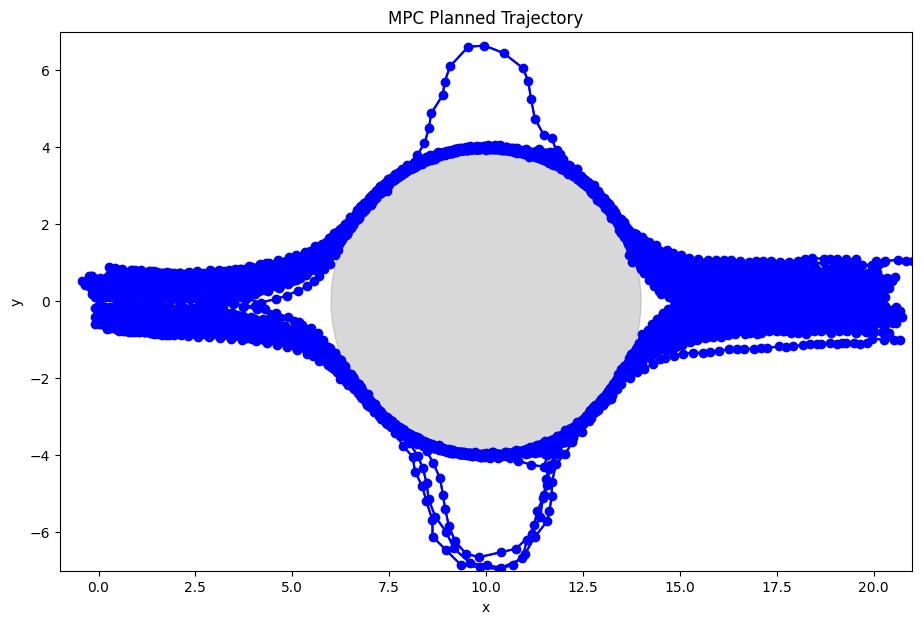

In [18]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/mpc_P25E1_vanillaCTDE_nofinalpos_matchtrain_50k/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

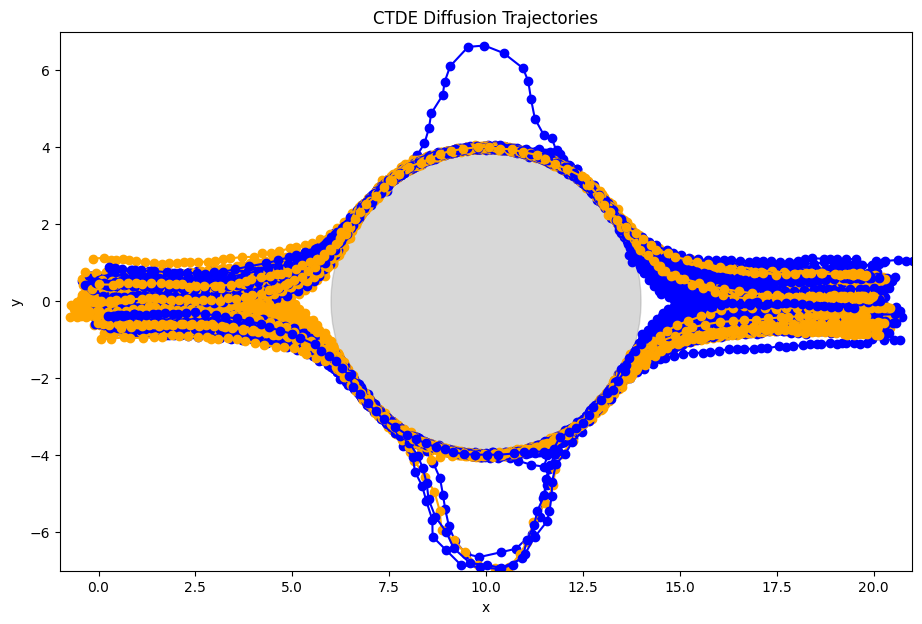

In [19]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [23]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(54)

In [21]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

0

In [22]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7, radius=3.6)

54

In [ ]:
# BC No Final Position 

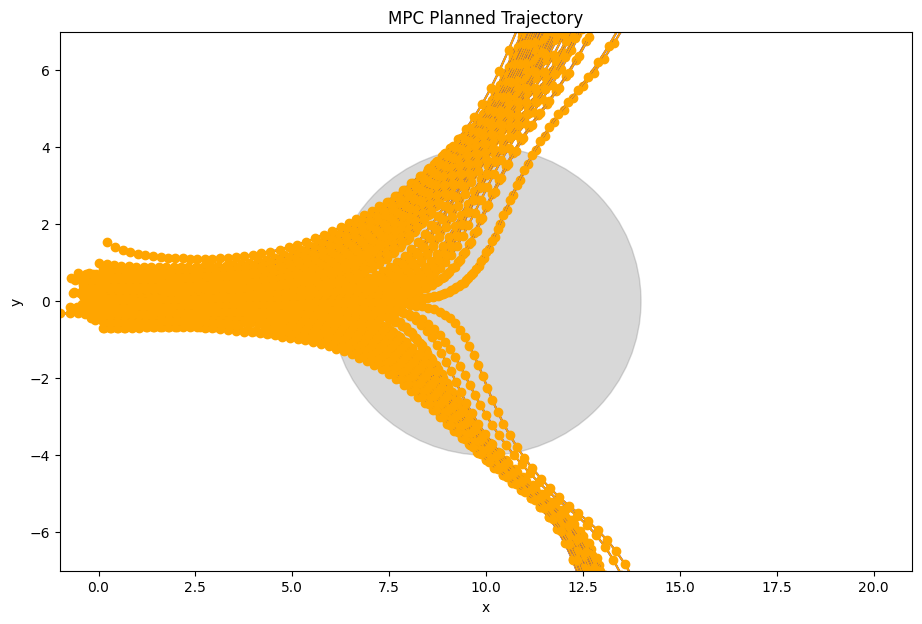

In [73]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/bc_nofinalpos_redo/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

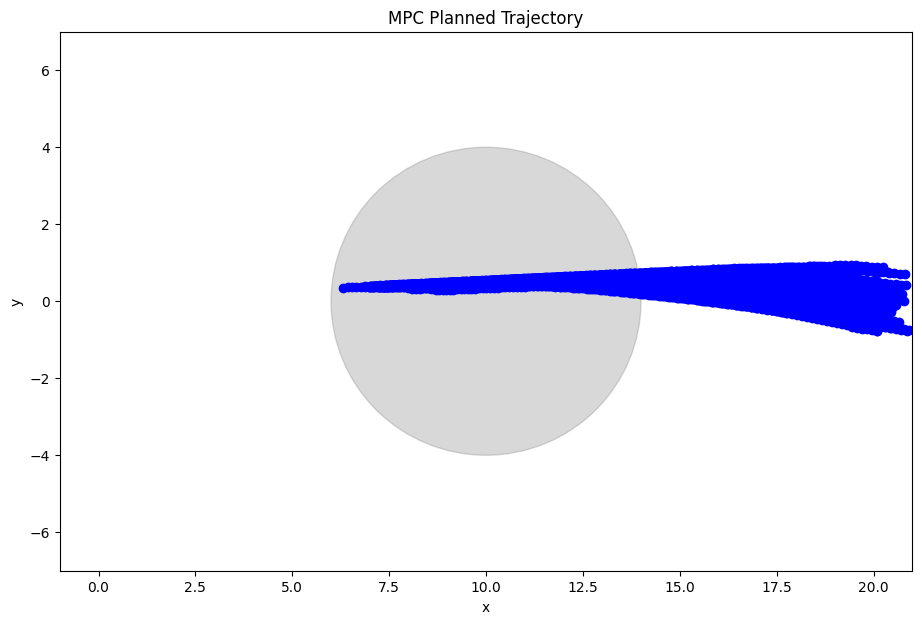

In [74]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/bc_nofinalpos_redo/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

In [75]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(2)

In [76]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

100

In [77]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7, radius=3.6)

100

In [ ]:
# MAGAIL Vary Init No Final Position

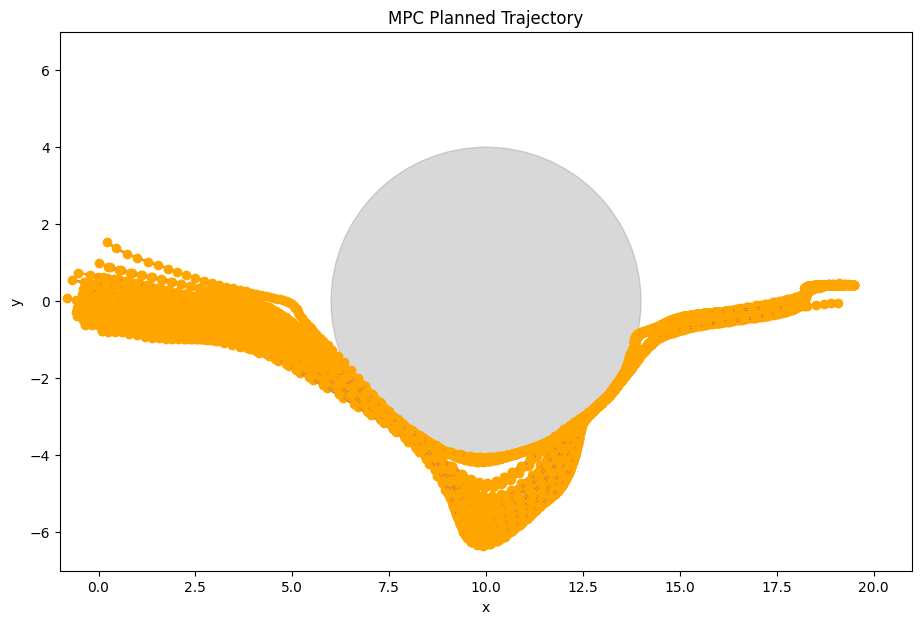

In [32]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_nofinalpos_matchtrain_50k/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

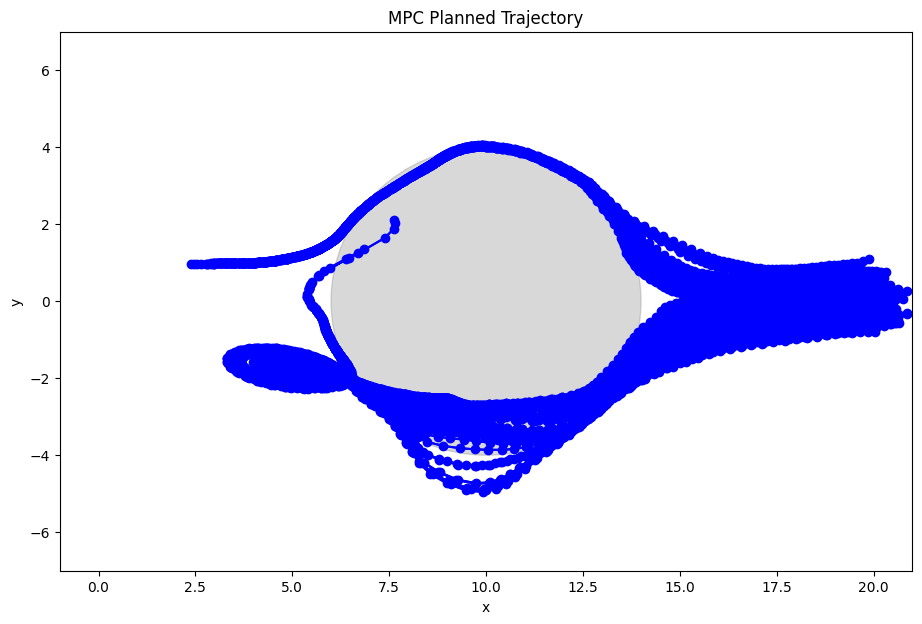

In [ ]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_nofinalpos_matchtrain_50k/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

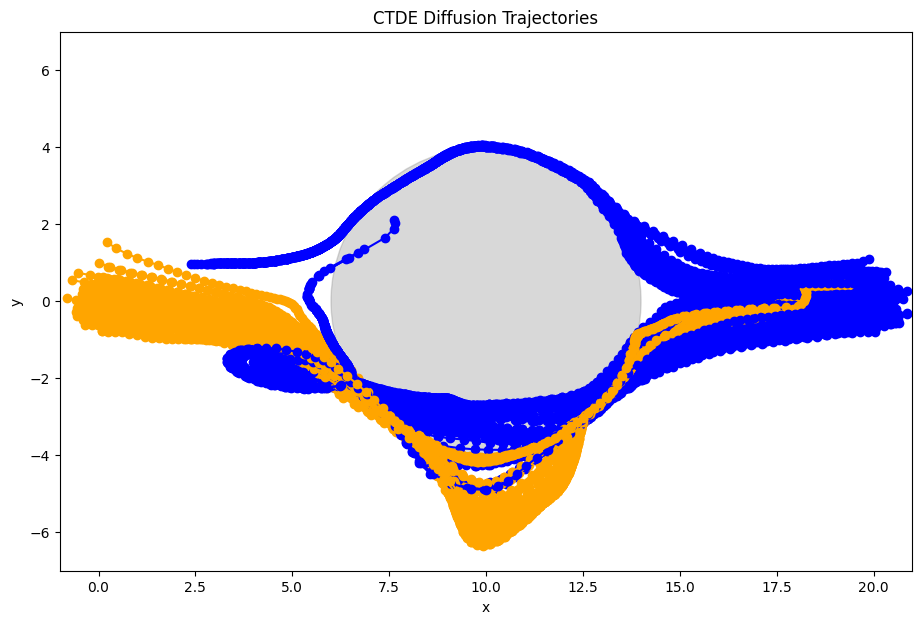

In [34]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [35]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(22)

In [36]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

56

In [37]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7, radius=3.6)

65

In [ ]:
# MAGAIL Static Init No Final Position Match Training

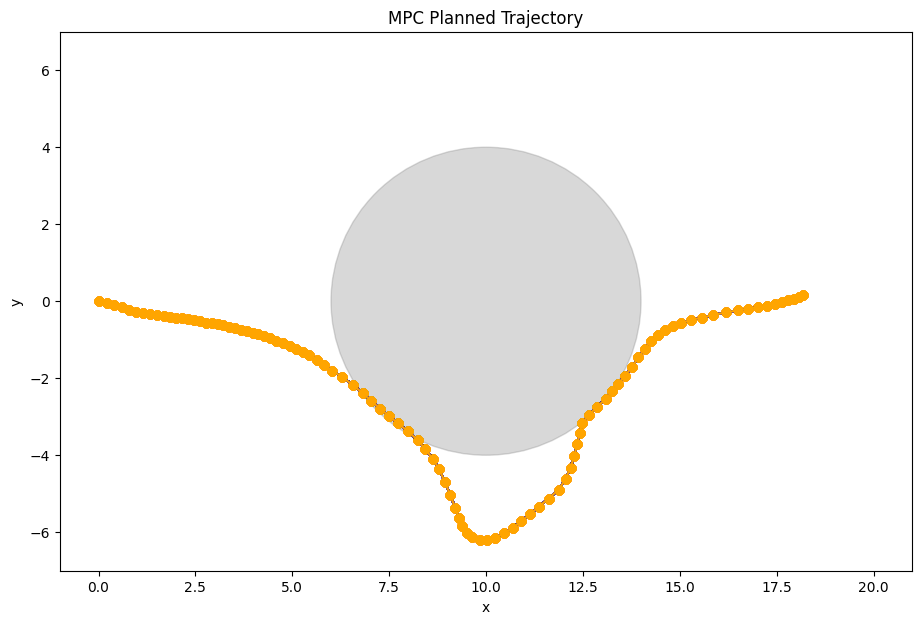

In [38]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_nofinalpos_matchtrain_50k_fixed/mpc_traj1_%s.npy" % i)
    expert_data1.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='orange')

plt.show()

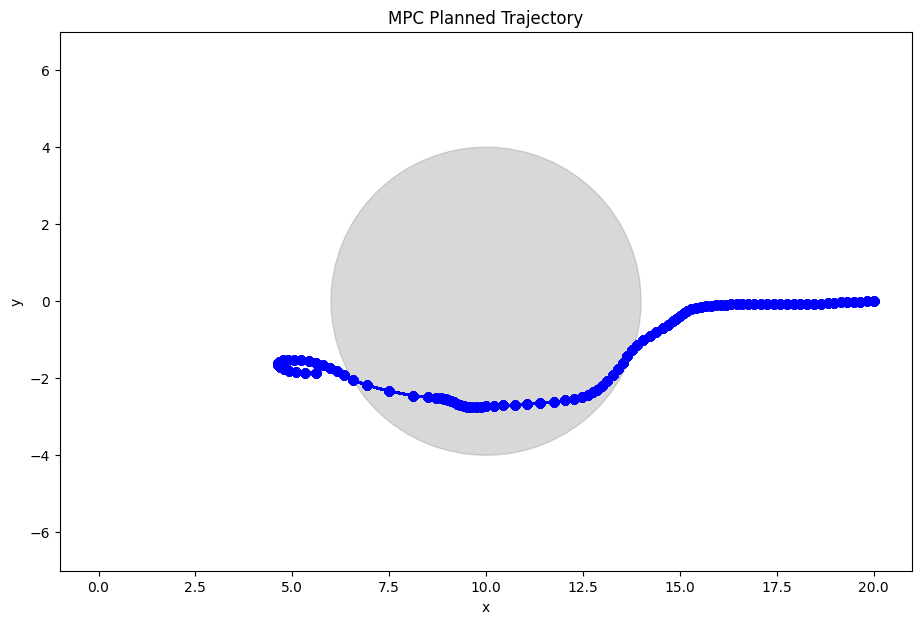

In [39]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = []

for i in range(100):
    data = np.load("sampled_trajs/magail_nofinalpos_matchtrain_50k_fixed/mpc_traj2_%s.npy" % i)
    expert_data2.append(data)
    plt.plot(data[:, 0], data[:, 1], 'b.-')
    plt.plot(data[:, 0], data[:, 1], 'o-', color='blue')

plt.show()

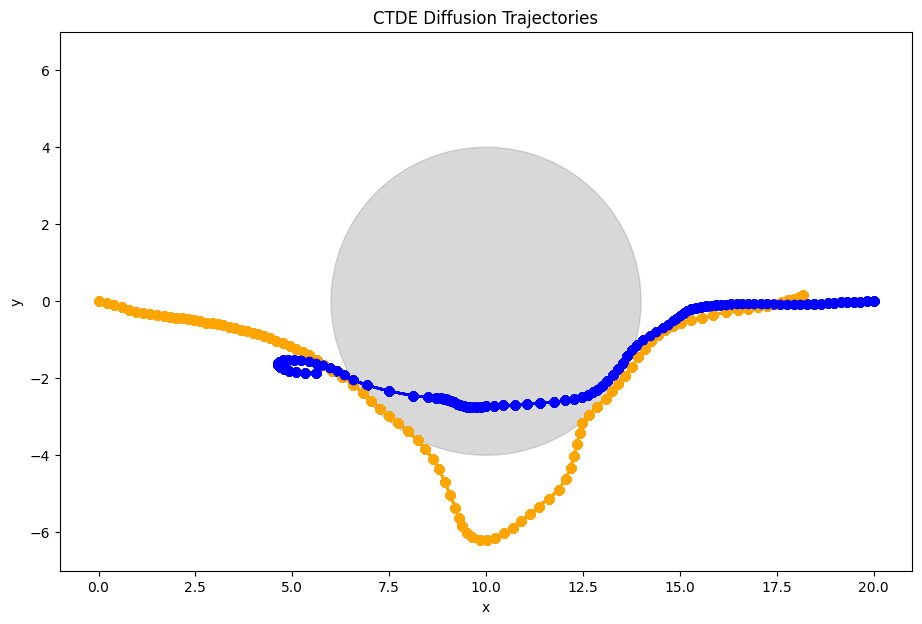

In [40]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("CTDE Diffusion Trajectories")

for i in range(100):
    plt.plot(expert_data1[i][:, 0], expert_data1[i][:, 1], 'o-', color='orange')
    plt.plot(expert_data2[i][:, 0], expert_data2[i][:, 1], 'o-', color='blue')

In [41]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7)

np.int64(0)

In [42]:
count_collisions_obstacle(np.array(expert_data1), np.array(expert_data2), radius=3.6)

100

In [43]:
count_total_collisions(np.array(expert_data1), np.array(expert_data2), threshold=2.7, radius=3.6)

100

In [ ]:
# Testing expert data

(100, 100, 2)


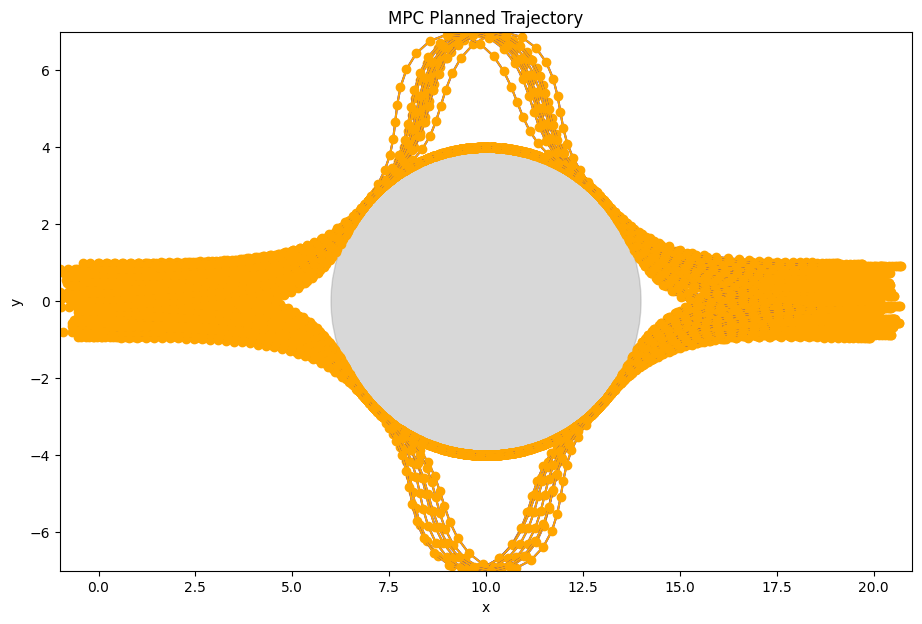

In [ ]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data1 = np.load('data/expert_data1_100_traj.npy')
print(np.shape(expert_data1))

for traj in expert_data1:
    plt.plot(traj[:, 0], traj[:, 1], 'b.-')
    plt.plot(traj[:, 0], traj[:, 1], 'o-', color='orange')

plt.show()

(100, 100, 2)


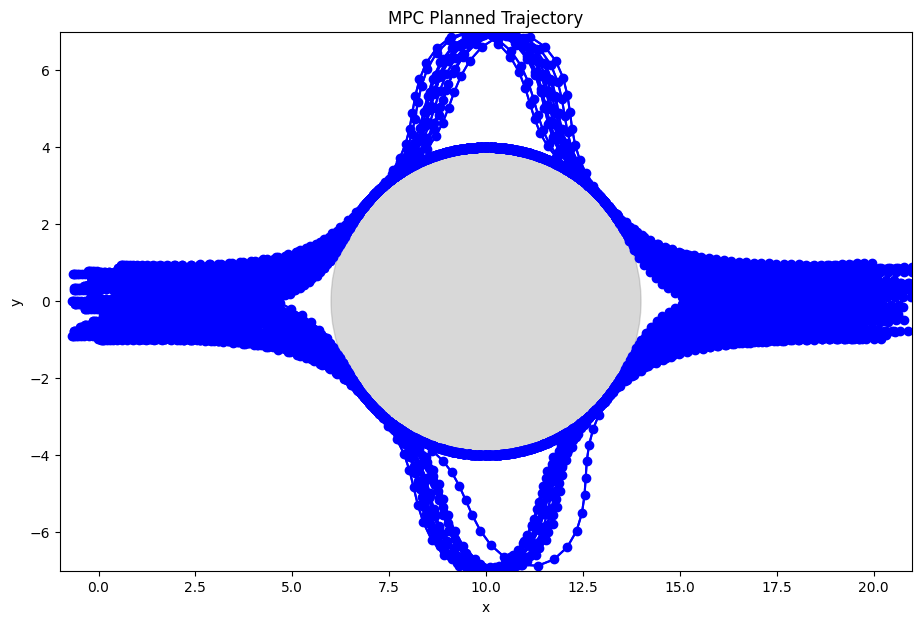

In [260]:
plt.figure(figsize=(11, 7))
plt.ylim(-7, 7)
plt.xlim(-1,21)
obstacle = (10, 0, 4.0) 
ox, oy, r = obstacle
circle1 = plt.Circle((ox, oy), r, color='gray', alpha=0.3)
plt.gca().add_patch(circle1)
plt.xlabel("x")
plt.ylabel("y")
plt.title("MPC Planned Trajectory")

expert_data2 = np.load('data/expert_data2_100_traj.npy')
print(np.shape(expert_data2))

for traj in expert_data2:
    plt.plot(traj[:, 0], traj[:, 1], 'b.-')
    plt.plot(traj[:, 0], traj[:, 1], 'o-', color='blue')

plt.show()

In [263]:
count_collisions(np.array(expert_data1), np.array(expert_data2), threshold=3)

np.int64(43)